In [50]:
using Plots, LaTeXStrings, Optim, SpecialFunctions, Random,Distributions, Interpolations, Dierckx, NLopt, ForwardDiff, LinearAlgebra, StatsBase, ColorSchemes 
gr();#Load packages

In [51]:
function Stochastic(LX,LY,t1,A0,PM)  #Stochastic model
T=Int(t1)
Q=Int(sum(A0));
pos = [(0, 0) for _ in 1:Q]
NumAgent= zeros(length(pos))
    
count = 0
for i in 1:LX
    for j in 1:LY
        if A0[i,j] > 0
        count += 1
        pos[count] = (i,j)
        end
    end
end


for kk in 1:T
Q = length(pos)
count = 0

    while count < Q
        # Choose a random particle to move
        idx = rand(1:Q)
        count = count + 1
        xx, yy = pos[idx]

        # Choose a direction: 1=up, 2=down, 3=left, 4=right
        dir = rand(1:4)
        R=rand(1)
        if dir == 1 && yy < LY && yy >  1 &&  R[1] <= PM
            yy += 1
        elseif dir == 2 && yy < LY && yy >  1 &&  R[1] <= PM
            yy -= 1
        elseif dir == 3 && yy < LY && yy >  1 &&  R[1] <= PM
            xx -= 1
        elseif dir == 4 && yy < LY && yy >  1 &&  R[1] <= PM
            xx += 1
        end

      if dir == 1 && yy == LY  &&  R[1] <= PM
            yy += 0
        elseif dir == 2 && yy == LY  &&  R[1] <= PM
            yy -= 1
        elseif dir == 3  && yy == LY  &&  R[1] <= PM
            xx -= 1
        elseif dir == 4 && yy == LY  &&  R[1] <= PM 
            xx += 1
        end

        if dir == 1 && yy == 1 &&  R[1] <= PM
            yy += 1
        elseif dir == 2  && yy == 1 &&  R[1] <= PM
            yy -= 0
        elseif dir == 3  && yy == 1 &&  R[1] <= PM
            xx -= 1
        elseif dir == 4  && yy == 1 &&  R[1] <= PM
            xx += 1
        end
        
        pos[idx] = (xx, yy)

    end


end




for i in 1:Q
NumAgent[pos[i][1]] = NumAgent[pos[i][1]] + 1    
end

return NumAgent
end

Stochastic (generic function with 1 method)

In [52]:
function loglhood(count,a) #loglikelihood function 
σ=a[3]    
C(x)=a[1]*(erf((h-x)/sqrt(4*a[2]*T))+erf((h+x)/sqrt(4*a[2]*T)))/2
dist=Normal(0,σ);
ℓ=0.0
for i in 1:LX
ℓ+=loglikelihood(dist,(count[i]-LY*C(xxloc[i])))
end
return ℓ
end

loglhood (generic function with 1 method)

In [53]:
LX=200 #Stochastic simulation problem definitions
LY=50
PM=1.0
D=PM/4
T=100.0
U0=0.5
h=25 

A0=zeros(LX,LY)
xxloc=zeros(LX)
yyloc=zeros(LY)
for i in 1:LX
    xxloc[i]=-LX/2+(i-1)
    for j in 1:LY
    R=rand()
    yyloc[j]=0+(j-1)
        if abs(xxloc[i]) <= h && R <= U0
        A0[i,j]=1.0
        end
    end
end

In [54]:
@time data=Stochastic(LX,LY,T,A0,PM);  #Calls the stochastic model, data below is the output used for reproducibility
data = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
    0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 
    0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 2.0, 2.0, 6.0, 1.0, 6.0, 7.0, 5.0, 8.0, 10.0, 4.0, 7.0, 19.0, 11.0, 11.0, 10.0, 19.0, 
    28.0, 19.0, 19.0, 13.0, 23.0, 32.0, 26.0, 23.0, 14.0, 23.0, 15.0, 21.0, 34.0, 19.0, 23.0, 34.0, 28.0, 28.0, 22.0, 23.0, 23.0, 39.0, 19.0, 
    35.0, 25.0, 35.0, 23.0, 20.0, 22.0, 23.0, 20.0, 25.0, 22.0, 24.0, 23.0, 17.0, 26.0, 23.0, 20.0, 27.0, 21.0, 22.0, 26.0, 21.0, 14.0, 12.0,
    7.0, 15.0, 7.0, 11.0, 8.0, 9.0, 2.0, 7.0, 6.0, 4.0, 1.0, 2.0, 1.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 
    0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 
    0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0];

  0.205751 seconds (308.45 k allocations: 17.099 MiB, 82.15% compilation time)


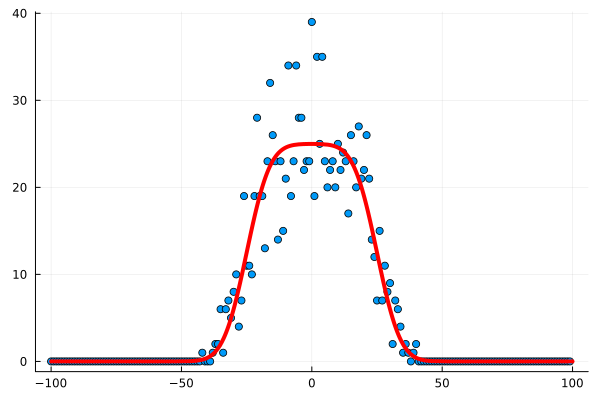

In [55]:
ue(x) = LY*U0*(erf((h-x)/sqrt(4*D*T))+erf((h+x)/sqrt(4*D*T)))/2;
p1 = scatter(xxloc,data,label=false)
p1 = plot!(ue,-LX/2,LX/2,lc=:red,lw=4,label=false) #Create simple plot to compare stochastic simulation data and PDE solution

In [56]:
μ=[0,0,0]; #Define distribution for the MCMC proposal kernel
var= [1e-4,1e-4,1e-3];
d = MvNormal(μ, Diagonal(var));

In [9]:
M = 10000 #MCMC samples
samples = zeros(4, M)
kount = 0

# Initialize parameters
θ = [0.1, 0.1, 1.0];     # Initial guess
ε = 1e-6                    # To keep parameters positive
ℓ = loglhood(data, θ)     # Initial likelihood

while kount < M
    x = rand(d)                      # Proposal noise
    θn = max.(ε, θ .+ x)             # Proposed θn
    ℓn = loglhood(data, θn)         # Likelihood at proposed θn
    α = min(1.0, exp(ℓn - ℓ))             # Acceptance ratio 

    if rand() <= α
        #println("Accept")
       
        kount += 1                   # Only increment on accept
        θ = θn
        ℓ = ℓn
        #println(θ)
        samples[1, kount] = ℓ
        samples[2, kount] = θ[1]
        samples[3, kount] = θ[2]
        samples[4, kount] = θ[3]

    if mod(kount, 1000) == 0
        println("sample: ", kount)
    end
    else
        #println("Reject")

    end
end

sample: 1000
sample: 2000
sample: 3000
sample: 4000
sample: 5000
sample: 6000
sample: 7000
sample: 8000
sample: 9000
sample: 10000


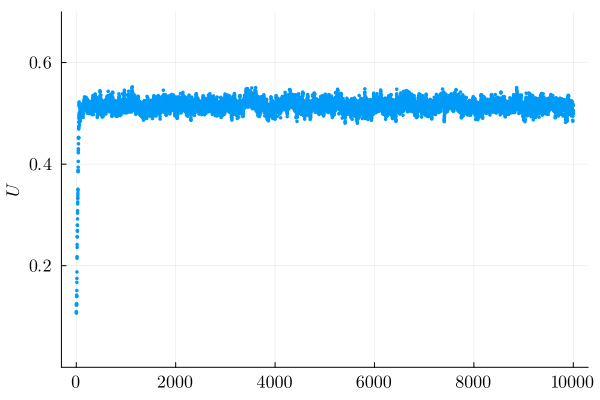

In [10]:
a1=scatter(samples[2,1:1:end],legend=false,msc=:auto,ms=2)
a1=plot!(ylims=(0,0.7),ylabel=L"U")
a1=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
a1=plot!(xticks=([0,2000,4000,6000,8000,10000],[L"0",L"2000", L"4000", L"6000", L"8000", L"10000"]))
a1=plot!(yticks=([0.2,0.4,0.6],[L"0.2", L"0.4", L"0.6"]))
display(a1)

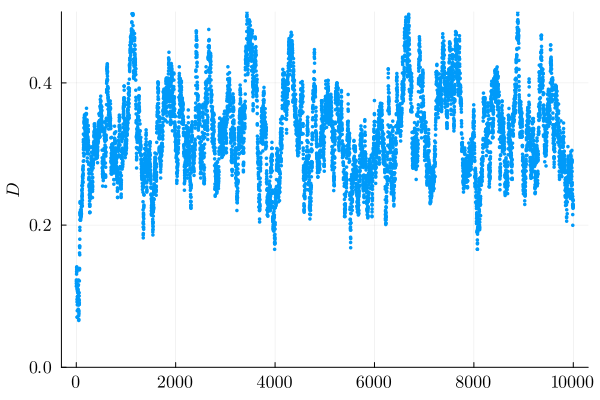

In [11]:
a2=scatter(samples[3,1:end],legend=false,msc=:auto,ms=2)
a2=plot!(ylims=(0,0.5),ylabel=L"D")
a2=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
a2=plot!(xticks=([0,2000,4000,6000,8000,10000],[L"0",L"2000", L"4000", L"6000", L"8000", L"10000"]))
a2=plot!(yticks=([0.0,0.2,0.4 ],[L"0.0", L"0.2", L"0.4"]))
display(a2)

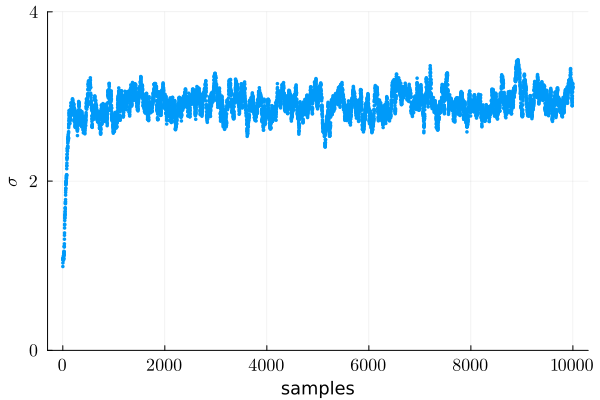

In [12]:
a3=scatter(samples[4,1:end],legend=false,msc=:auto,ms=2)
a3=plot!(ylims=(0,4),ylabel=L"σ",xlabel="samples")
a3=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
a3=plot!(xticks=([0,2000,4000,6000,8000,10000],[L"0",L"2000", L"4000", L"6000", L"8000", L"10000"]))
a3=plot!(yticks=([0,2,4],[L"0", L"2", L"4"]))
display(a3)

In [57]:
#Store samples for reproducibility
dataU = [0.5159550287688108, 0.5146605282792646, 0.5169322484765848, 0.5062102843913663, 0.5045859110762321, 0.504085478071797, 0.5104155750571553, 0.5043471986151005, 0.5122800879751426, 0.502525293597863, 0.5061026456566566, 0.506869704759881, 0.5054913972359627, 0.5189188056775723, 0.5074843762550882, 0.515968722495219, 0.5202291507307365, 0.5106083894538672, 0.5058687385805083, 0.508505905880566, 0.4985356785308616, 0.5028800765377457, 0.5013869064802392, 0.522430405986907, 0.5189634670619457, 0.519431744333557, 0.5142381914438217, 0.5138310921579953, 0.5203453541378288, 0.5199600738794966, 0.5181056694470406, 0.5166569620003797, 0.5157493763147147, 0.5188745083529286, 0.5113242817842748, 0.5173794593460852, 0.5123389147325949, 0.510000790703442, 0.5243411972508483, 0.5277136854828716, 0.526891382952782, 0.5206564889252379, 0.5155826242876099, 0.5032130620469092, 0.523818458565337, 0.5312045112708849, 0.5261697982396959, 0.5205248078124347, 0.5121303636953861, 0.5146671748197086, 0.5075533009691453, 0.5193680736120683, 0.5231203615744793, 0.5327270172886174, 0.5299282571470314, 0.5298726680407393, 0.5329545515704425, 0.5298185150524091, 0.5217163904430825, 0.5188337293351458, 0.5196770929242895, 0.5169269764871718, 0.5116405392194775, 0.51369146857492, 0.5297872514386771, 0.5159968536769645, 0.5107046059457189, 0.5244887534467584, 0.5208503514750532, 0.5184748641712977, 0.5230723313525711, 0.5165544017449342, 0.5107503833377852, 0.5103799929150216, 0.5088693552473612, 0.512518263425982, 0.5116788831546962, 0.5102146449472222, 0.5083880866594075, 0.5038080784770513, 0.5074785986386287, 0.5131741527660655, 0.5073238309425594, 0.49736011012648884, 0.49961879265992226, 0.5035905518104857, 0.5095174314494001, 0.5089717408605096, 0.5070645281462084, 0.5070579147840559, 0.5089605892441024, 0.5175784360852281, 0.5130512721315676, 0.5056194469970607, 0.5071298728765556, 0.4970161954980557, 0.5004609826833241, 0.5093691289375554, 0.5095524935511925, 0.5061157509178985, 0.51689795754947, 0.5255644199226117, 0.512382685203012, 0.5093183167313899, 0.5092655452596822, 0.5140024472210146, 0.5097002711158906, 0.5135800106854558, 0.5192687180853462, 0.5159314790869858, 0.5217569196125887, 0.5243287834031893, 0.5202358499012011, 0.5303784972104311, 0.5242809708835695, 0.5284034492393441, 0.5231503548548813, 0.5107640499439252, 0.5108772602263608, 0.5095089287755864, 0.5167237873126758, 0.5142904981202864, 0.5204020801306758, 0.5196261906741069, 0.5124925574949131, 0.5217825729715483, 0.5201234098287417, 0.5164972165833203, 0.5242286952443301, 0.5258077843494615, 0.5177642290414946, 0.509105505755682, 0.498975148057159, 0.5166118203782722, 0.5157889056740629, 0.5245720862224674, 0.5298332705339943, 0.5201549813522626, 0.521791657874315, 0.5257976116055787, 0.5292588553259069, 0.5223511652660198, 0.5170675328606383, 0.5199027532637476, 0.517007055867029, 0.517954805555348, 0.5351725764986264, 0.5304066737149504, 0.5403148973874051, 0.5390386414728107, 0.5221825635702082, 0.5128399551561725, 0.5161447778467596, 0.5181589347128652, 0.5133987160367861, 0.5128233738356305, 0.5159351361315992, 0.5217918858670602, 0.521637810400258, 0.5141673717880425, 0.512179192544797, 0.5193080704058426, 0.5268619414066672, 0.5153747143952487, 0.529671673856422, 0.5225278627018749, 0.5262391158272816, 0.5325598505499447, 0.5349539730665464, 0.535263757550469, 0.537392721279439, 0.5345931843694817, 0.524930375471723, 0.5238928294248034, 0.5218454247867722, 0.5228840309711577, 0.5205153614439337, 0.5246970270687165, 0.5153723496681469, 0.5268770639571606, 0.523430358873907, 0.5127038790652984, 0.5181383904465496, 0.525426650970892, 0.5244108078647055, 0.5339329572180685, 0.5340263284573168, 0.5316703826476129, 0.515895897218569, 0.5171305294959581, 0.5347963496483511, 0.5189417133296227, 0.5080999012307649, 0.5107579116059475, 0.5177617785178923, 0.5201478114494013, 0.5171071844086303, 0.5142255490367392, 0.5231640230786798, 0.5161571185514643, 0.5086858233811216, 0.49983507016905165, 0.5034828142346603, 0.5080715020906447, 0.5201808954145091, 0.5147134871766257, 0.5184879185561545, 0.5199481277456464, 0.5126930330829029, 0.5048298943150555, 0.5103396531907232, 0.5104598022903852, 0.5120133903029911, 0.5185784563911645, 0.5227431966965048, 0.5234897639619097, 0.5238673937434596, 0.518273055844603, 0.5034306468785753, 0.5053596954938496, 0.5023653369813084, 0.5025655214774689, 0.508513073795775, 0.5047101875653742, 0.5172310991285232, 0.5217366483050456, 0.5093235779649712, 0.5151129458107127, 0.5139890168403323, 0.506624453918247, 0.5088589849926636, 0.5148408970513162, 0.5170140444929483, 0.5325754145793445, 0.5279987967731944, 0.5168151031739475, 0.5143117764911025, 0.5174786429052266, 0.5140431957689583, 0.5137937784864308, 0.508959422145824, 0.5251031670277851, 0.5203072904502988, 0.5227655664012744, 0.5179623662848987, 0.5054317887250762, 0.5087302560425967, 0.5159710746619829, 0.5078948037618897, 0.526347434746222, 0.5183584785250079, 0.5147699227386296, 0.5108431768954664, 0.5147695051978572, 0.5057052405185004, 0.5156807455290745, 0.5121248440680172, 0.5235695739802074, 0.5170986827702937, 0.5063220507281918, 0.5127726350910731, 0.5192768522106787, 0.5238045854412516, 0.5122595226521592, 0.5078424719787614, 0.5082031586499984, 0.5207317141151414, 0.5294609667512701, 0.5135402443536169, 0.5116054417492025, 0.5141067326366083, 0.5126129923774807, 0.5264476957140913, 0.5134013135796508, 0.5160762536874084, 0.5052999627193104, 0.5201354042002323, 0.5227491781288903, 0.5200618432249108, 0.5200772734774749, 0.5235251035431521, 0.531415644814302, 0.5157541412755161, 0.5115774893187688, 0.5057792281934765, 0.5050284145456471, 0.5114008087980607, 0.5019014782112895, 0.5060205232445738, 0.5060200154955913, 0.5195810447447946, 0.5081806711450293, 0.5030002331902249, 0.5038019878044793, 0.49640158101052584, 0.5126855138945458, 0.5041932120299631, 0.51105593501888, 0.5111260887228468, 0.5172739263284009, 0.5250076979495575, 0.5178253096109879, 0.5153539027306164, 0.5202132125325507, 0.5292592248096178, 0.5174637108688404, 0.5176448020713662, 0.5153506671523195, 0.5296301145821198, 0.5154118211805735, 0.519608799437025, 0.5174275846869113, 0.5165969894619492, 0.5213335043775496, 0.5065823932626107, 0.4963084729599715, 0.5044330840936576, 0.5109167591913337, 0.5270997867402395, 0.5275204439217006, 0.5075132922267831, 0.49677875131711857, 0.5061270826517712, 0.5134566699023336, 0.5195542169089793, 0.5070011928814874, 0.5238122873969108, 0.5202263780271865, 0.5064968534418377, 0.5132349031302946, 0.5145004541638599, 0.5128173996045343, 0.5271419072957854, 0.5235608975055752, 0.5259255976333664, 0.5226544239243496, 0.5151206679450344, 0.5192056274331501, 0.526865899996016, 0.5206393763723738, 0.520192557116206, 0.5124537575407915, 0.5125871835320553, 0.5212274725343333, 0.5142012209362862, 0.5071701356230893, 0.5152141865274046, 0.5060964707847148, 0.5179481311990091, 0.50911525285151, 0.5022712587567193, 0.5037975703010107, 0.5023732758682471, 0.5018246773423733, 0.5203626173735412, 0.521071841882996, 0.5082197158920633, 0.5013341444577971, 0.5090771655449072, 0.5098646114784358, 0.5148212085806512, 0.5155828782141141, 0.5104065597997876, 0.5029270034191897, 0.494350069748569, 0.49759285883499393, 0.5067568004022875, 0.5135707952952029, 0.5091422466812853, 0.5151555866338344, 0.511045284465327, 0.511203856087859, 0.515849062140534, 0.5168182376325267, 0.5116260074854011, 0.49854217679103274, 0.502169211326869, 0.5035831869605126, 0.5187329225141369, 0.5193887369546685, 0.5037771641079847, 0.5257013844900474, 0.5242209334760262, 0.516459632089211, 0.516683817710789, 0.5135070549927012, 0.5160320576146258, 0.5100777563577652, 0.5031500059150595, 0.5128474412655634, 0.4945468191656752, 0.4986492994483586, 0.5067101373917378, 0.506811289400644, 0.5088892689864472, 0.4995926670260315, 0.49467972437971575, 0.4937605913804861, 0.5076663824641857, 0.5032281027301823, 0.4891675624248455, 0.5012134540191803, 0.4926979161416427, 0.5115575684381796, 0.4918404954307749, 0.4960688097411202, 0.4958649395022648, 0.5046819765893272, 0.5024795768872538, 0.5001434163684325, 0.5005324876439982, 0.4874187558462548, 0.499774340819398, 0.4925062742296387, 0.5039014253469402, 0.5036248659309265, 0.5074871919355826, 0.5006690107601218, 0.5092638970850333, 0.5047661763385982, 0.5122633788491249, 0.5167702229007869, 0.4961889102267394, 0.4982620421342613, 0.49398965959787006, 0.499357630124505, 0.500580230432382, 0.5051028861000582, 0.5064498155518662, 0.5072411869568604, 0.5041411248239711, 0.5108387828667744, 0.5189925331679642, 0.5150992315314337, 0.5150342791260947, 0.4994642814544711, 0.4992880649409445, 0.504118671979887, 0.507980014655149, 0.5096876977899127, 0.5308883569872777, 0.5242480722244681, 0.5219937534273371, 0.5011992063492482, 0.5233636792675002, 0.5034843750920123, 0.5062803360164672, 0.5006564564870916, 0.4991348370113643, 0.5171876870042224, 0.5164289355638374, 0.5260506520564208, 0.5177168489563349, 0.5236150354898682, 0.5116934108950867, 0.5141093167195261, 0.5098069563331206, 0.5121762453135811, 0.5153201926332965, 0.5188402434095322, 0.5119213432612809, 0.5088960935081661, 0.5126588766720435, 0.5161445338552288, 0.5185133427932078, 0.5179725481893697, 0.5282053931339064, 0.5217016748929604, 0.5164802721906268, 0.5255175598340968, 0.5277050900318816, 0.5250906221473303, 0.5151480627823641, 0.5119371760218899, 0.5147136286684472, 0.5116775323865675, 0.5109189848214509, 0.5056957616866502, 0.5062111019144879, 0.5246103510995348, 0.5175500032422611, 0.5125265322713346, 0.5118143456714886, 0.49258549706870103, 0.48986249059455894, 0.48641341252909653, 0.49011547109414694, 0.49872762942539467, 0.4993551647515797, 0.4985520116902386, 0.5023387171243462, 0.5075714551400191, 0.5217963386700452, 0.5189309338290902, 0.5105952771381131, 0.5148917684681658, 0.529114766637063, 0.5317006740970933, 0.5269154380395636, 0.5227329427555034, 0.5292687145890356, 0.5183754864837796, 0.5163539627757019, 0.5044936606149413, 0.5074916350644845, 0.5073352455762081, 0.5057810026980464, 0.5077396305375734, 0.5111664474553872, 0.5196756262393144, 0.5210722463032262, 0.5085122309028725, 0.5055154085298188, 0.523930281953657, 0.5295611253136607, 0.5255950712361891, 0.5170389727196402, 0.5197318828492385, 0.5147993696745602, 0.5085172517523505, 0.5159169521608931, 0.5223298807931632, 0.5268711195441542, 0.5167558593276914, 0.5065865098463466, 0.5055046297950262, 0.5202688939718383, 0.5273934246199017, 0.52470342415102, 0.5155451749251293, 0.5208893402163884, 0.516209141812183, 0.5160253266609621, 0.5136003415006662, 0.5208234157068568, 0.5091859358319784, 0.5094418266873, 0.5098749741694044, 0.5132845931277398, 0.5199199663425902, 0.5137803434379098, 0.5170842490887313, 0.5113893146617398, 0.5216499632770024, 0.5144416022049604, 0.5140346699246882, 0.5196480108711846, 0.5248260153626295, 0.5261364261725515, 0.5169780648942657, 0.5110399604648999, 0.5025650690972145, 0.49941168679656694, 0.5025373321251199, 0.5010173456296995, 0.51038361727444, 0.5076945105288609, 0.5012482657168705, 0.5193061966155011, 0.5295559513528432, 0.5239949213392949, 0.5190331956035911, 0.5168325369778785, 0.5123833958368167, 0.5121934938682552, 0.5090766818099066, 0.5181870689470716, 0.5184476567128581, 0.5055024858599011, 0.5036172890213686, 0.49796198219644144, 0.5119662547670181, 0.4988057457784838, 0.5045673471699849, 0.5040503011324657, 0.5085233280819343, 0.512526122826639, 0.5134905769155641, 0.5159252992174429, 0.5033351161716046, 0.4986266645688143, 0.517325635080036, 0.5214994962077384, 0.5211267977361527, 0.5280820984802013, 0.5282659666228803, 0.5224379575660041, 0.5214925853610914, 0.513255646009767, 0.49928406799553143, 0.49783011835214036, 0.5018452812603966, 0.4966995216071235, 0.5063449302139328, 0.5138602616931791, 0.5159239724081124, 0.5195666153744382, 0.5154695839155945, 0.5061972447292341, 0.5150883211452545, 0.515378429604536, 0.5188653709231417, 0.5125254179234732, 0.5076491362389075, 0.49968180639315024, 0.5258483302505991, 0.5088522297667741, 0.5085325285610083, 0.5017804660152314, 0.49132377944962136, 0.5132342882239683, 0.49626233080771825, 0.49926840405587253, 0.5016011870891911, 0.5059915134932035, 0.5192676558190228, 0.5049985800395843, 0.5147949944640451, 0.5168421299834354, 0.5294065506528841, 0.4999577642628653, 0.5007048071727348, 0.5034727402116059, 0.49856522762533806, 0.5085980163588111, 0.4999535613039251, 0.5069335732275291, 0.5074026715570356, 0.503291067316354, 0.5160227026253436, 0.5188378536118644, 0.5215295057121159, 0.5079309139792331, 0.4958159839643781, 0.5003594297067626, 0.49838704865435446, 0.4989781808352565, 0.522068217807346, 0.5136722456678183, 0.503790420835617, 0.5155721504604832, 0.5142401553683772, 0.5181323457976907, 0.5054367320161782, 0.497670151858362, 0.4985728014381083, 0.5189066737776714, 0.5226514595885142, 0.5256742996405183, 0.5264243288201356, 0.5173110976945532, 0.5131193114182294, 0.5094224892563484, 0.5081591919188849, 0.5157884509819298, 0.5079898954845069, 0.5098127375345783, 0.5119878116975329, 0.5234448568355485, 0.5112696515551628, 0.5100730607094285, 0.5023133449587688, 0.5077561034000866, 0.5111386718254619, 0.5095110191038178, 0.5088010964328789, 0.5061472033525117, 0.5079973260624788, 0.4992104691427591, 0.517659168027117, 0.5134937674960859, 0.5185588911674833, 0.518424627465174, 0.5150935105962501, 0.5140259967938053, 0.5213011578296812, 0.5216491769149495, 0.5273376608025167, 0.5221692675109046, 0.524890354523608, 0.5156339397949433, 0.5212322396721327, 0.5195046139275408, 0.530171552622568, 0.5214990257560745, 0.508071322924455, 0.5058057935040166, 0.5152392557357656, 0.5138468790771847, 0.5173214732712397, 0.5108961677914788, 0.5200788215183048, 0.5288963471514704, 0.5256409328596294, 0.5293943734847226, 0.5257785856503433, 0.5210703087094195, 0.5182809987037643, 0.5194807482197055, 0.5128915261592185, 0.5154836940948899, 0.5101252180441858, 0.5011316150858967, 0.5008708376754911, 0.5031158164914169, 0.49492487979744004, 0.49367687863479426, 0.49886282747195815, 0.5031589784403498, 0.5085333687327107, 0.51191947089873, 0.5096794732686224, 0.523887522863018, 0.5249194015477257, 0.5214392762041637, 0.5180222536847253, 0.5224542390395305, 0.5238809976969917, 0.5085673334752691, 0.513342210398414, 0.5205785408737184, 0.5163985108985546, 0.5155143175123673, 0.5212849387542817, 0.5163569665834309, 0.516227692042139, 0.5323345463836315, 0.5342755233998799, 0.5297617816937071, 0.5216918965266921, 0.5256690505471984, 0.5254912773954106, 0.5302213953352191, 0.5438770271840397, 0.5329016213465424, 0.5307222444459486, 0.5310068220054278, 0.5355758484064073, 0.5338611101609315, 0.5325542811441054, 0.535180521031707, 0.5368942279302859, 0.5344326285896138, 0.5350778884782444, 0.5330518965870784, 0.5262382893272982, 0.524602241616366, 0.5315086703689801, 0.5091899404501871, 0.5055125077189484, 0.5128448306778591, 0.5136469868908294, 0.5191052672400344, 0.526400332192848, 0.5263771708242018, 0.5367066240411686, 0.5351773201724587, 0.5377835916732149, 0.5204066608707318, 0.5141768527712066, 0.5116878017505496, 0.5117687327429787, 0.5186720521943543, 0.5156758471199153, 0.5135353083641583, 0.5178477675112008, 0.5158238322252303, 0.5159079088504592, 0.5000406692724554, 0.4978634908205141, 0.4893981104356262, 0.5072462568553192, 0.5118450248050718, 0.5084052557978388, 0.5114515566485247, 0.50939154129635, 0.5244631820681048, 0.529593623137227, 0.524945764035264, 0.5216637897921884, 0.5212851332671992, 0.49798204016154934, 0.5035451284166191, 0.5042213560846771, 0.5069197132506224, 0.5082360210990058, 0.5191888132840207, 0.5156763930557824, 0.5103327523154184, 0.5126078612437038, 0.5159329674803563, 0.5215998652135145, 0.5197308086562905, 0.5191356005620047, 0.5201998450605027, 0.5100690108172529, 0.5133985923788541, 0.5189810368895963, 0.5093119732703877, 0.5035118182001957, 0.5071375408768997, 0.5136962546091592, 0.4908157786409462, 0.5056042758470304, 0.5224874419252038, 0.5146400605923158, 0.5130497699395985, 0.5141299955998623, 0.519663498047182, 0.5206434039349924, 0.5129419722832743, 0.5127927902928558, 0.5161611685920238, 0.513715072790812, 0.524903150631521, 0.5121750278079807, 0.520301296524811, 0.519228633813545, 0.5146108080864877, 0.5095263208028687, 0.5061040606257245, 0.507118876665099, 0.5116433026099081, 0.508415108222333, 0.5208451264280667, 0.5156227228358653, 0.5207135575720147, 0.5090033089251652, 0.4999652788404712, 0.5072136130166177, 0.5067053536863667, 0.509325031952832, 0.5150963174433771, 0.5052421366942881, 0.5160183265127161, 0.50485303251115, 0.5163001546676402, 0.5098852599002149, 0.5179259925071886, 0.5147302087986576, 0.5081738301731614, 0.5085044934262257, 0.5197050067308465, 0.5143167001684417, 0.513243404220081, 0.5048394639484347, 0.5056703049647137, 0.5045663028832215, 0.5200509394177578, 0.5178879783823277, 0.5137182014575559, 0.5188674604836693, 0.503951077318988, 0.5096733272663552, 0.5055410012412358, 0.5040914881102647, 0.5075922880349684, 0.5029584296486175, 0.5121441558054991, 0.5168602240851987, 0.5099138563745736, 0.5088797174123046, 0.5160777669883717, 0.5053492479475128, 0.5005453148999417, 0.5083864920172857, 0.5092744681534884, 0.5013335276558457, 0.5177305411762998, 0.5124834205445776, 0.5057546129179259, 0.5039828452029884, 0.5140873934031889, 0.5138831076898662, 0.5095740286935119, 0.51891060919907, 0.5201358544042994, 0.517745795830233, 0.5141501507097663, 0.5193370112455382, 0.5107963116142729, 0.5182004006219063, 0.5207047809250516, 0.5167019893164946, 0.5178216080824034, 0.5169738413628582, 0.5156230478814062, 0.5116012084201634, 0.511308700099284, 0.5130098274817705, 0.5190866916012152, 0.5105421002726388, 0.5101924440929929, 0.5147631244827462, 0.5106344846297964, 0.5245475872201811, 0.5151733487061255, 0.520190838059635, 0.520285145662802, 0.5234661437345061, 0.5189095201326397, 0.5215767178854052, 0.5121411128506245, 0.5151436738874092, 0.5106843982806636, 0.5277236379419682, 0.5223305109326033, 0.5119783216152601, 0.518403784527246, 0.523346658802587, 0.5203719575928266, 0.5204095579138127, 0.5172607439459249, 0.5151493079084974, 0.5032851667537389, 0.5000004893140362, 0.5079805365473646, 0.5269979403448621, 0.5310569197890057, 0.5272491492019147, 0.533872514779758, 0.5311205154985638, 0.5239430018391025, 0.5182250339060492, 0.5255683135383094, 0.5248801914653097, 0.5341001163059077, 0.534547930660228, 0.5250529955161991, 0.5161709580992772, 0.5286236435961489, 0.5231888769923579, 0.5194486180694124, 0.5229640190038428, 0.528149417512001, 0.5360294383198164, 0.5388777586629464, 0.5323647285650113, 0.5394584031379719, 0.5402973649554931, 0.5367716717624732, 0.5253424750185318, 0.5251647953174935, 0.5327970641695033, 0.5317495135690061, 0.540062100063214, 0.5278915722247951, 0.5201409423002685, 0.5149297395105671, 0.5298811348066486, 0.5250551962723867, 0.531023280841425, 0.5218038601970192, 0.5297141096087646, 0.5301200711586141, 0.526298173832827, 0.5204930292711778, 0.5124539063880952, 0.5057489113196444, 0.5250406683783985, 0.5350115720711293, 0.5320588775431477, 0.5315647482662912, 0.5139683479993729, 0.5060731495734114, 0.513679360996316, 0.5158938871739579, 0.5232250986856994, 0.5227337512835585, 0.5271303132301094, 0.5206717136443038, 0.5227267531419926, 0.5297618645183995, 0.5285349557808267, 0.5221685714350008, 0.511647399032313, 0.5248116670754442, 0.5182562173991399, 0.5173381575167292, 0.5235666647189064, 0.5225328836632818, 0.5280166496205327, 0.518452446935154, 0.5356226556666537, 0.5442550010760647, 0.5471972234763055, 0.5473444726274965, 0.5462555173980331, 0.5436987791379562, 0.5421023613457678, 0.5421432248011705, 0.5419683333771963, 0.5355016054559905, 0.5311120880149388, 0.5285430119885379, 0.5057706953013077, 0.5031989352811581, 0.5014632509586382, 0.5240325828176527, 0.5106749431456986, 0.5078192722512145, 0.5099943401370578, 0.5012339913423862, 0.5035021270816995, 0.5032605182541343, 0.5043897557017495, 0.5136132685330684, 0.5097808076234936, 0.5169818588876078, 0.5148975326811005, 0.5177986802237686, 0.5162417511072224, 0.5276355786687692, 0.5313507669586641, 0.5314698280615189, 0.5129048741669456, 0.5010159362125159, 0.523519131616956, 0.5264571186552269, 0.524744254418843, 0.517664814171529, 0.5232732800547758, 0.5321020089047298, 0.5236343814787279, 0.5349561551387619, 0.5135254103732978, 0.5082015926346592, 0.5073474505541525, 0.49583115671176886, 0.5072490018934112, 0.5128713903121259, 0.5208875960607522, 0.515522854432484, 0.5002282812943074, 0.5026728105848336, 0.5052689593138157, 0.5071896207017469, 0.5211091070849933, 0.5066811757764242, 0.5108416289840368, 0.5141901588169565, 0.5203933091973069, 0.5112967672679997, 0.5163584396461474, 0.514939398346907, 0.517064902001164, 0.5226173218410184, 0.5196245394223995, 0.5136750085859546, 0.5176827397815514, 0.5078587966258984, 0.5010257931141543, 0.4996948125591842, 0.5017135394259195, 0.5089636770792735, 0.5144994376851452, 0.5283689538239064, 0.526133557306457, 0.521378687151888, 0.5303746837387597, 0.5088595589274474, 0.5166304954152032, 0.5100861692674276, 0.5269117844600892, 0.5306813192805316, 0.5303338955512401, 0.534432730633333, 0.5228665559539167, 0.5159694843564548, 0.5146480229488871, 0.5138977536209566, 0.5162915052214678, 0.4988555108129631, 0.5014564040694671, 0.496176403099856, 0.49639498028143153, 0.49921763683743037, 0.5126348883287254, 0.5161240119680122, 0.5064892134676721, 0.5144516815323343, 0.524263578695834, 0.5131476428704171, 0.5205552889420302, 0.5244753509843586, 0.5134531087967201, 0.5102894143021516, 0.49923145630311766, 0.49820765320600296, 0.5018498479202722, 0.4988605478098267, 0.515488581546036, 0.5229975266644046, 0.5113957109895609, 0.5111577968239809, 0.5187590297461847, 0.5221324650843829, 0.5054833440007551, 0.5087222353130124, 0.5185315482792205, 0.5196074663845157, 0.5146575163660246, 0.514023652670173, 0.5153094413540302, 0.5038297198260062, 0.5045787476278963, 0.5125441810557548, 0.510542869409599, 0.5021050264686419, 0.5054206944189711, 0.5075069467516887, 0.509731992864682, 0.507804945745276, 0.5077736904233792, 0.5065086451856139, 0.5028090033104535, 0.501138608493983, 0.5069252596461616, 0.5113142721792854, 0.5224255988642298, 0.5246439650640426, 0.5197484255203304, 0.5192827007241066, 0.5207773829129447, 0.5156609415165653, 0.5132763435985607, 0.5090167392851779, 0.505719243771951, 0.5172657478565196, 0.5158050171948334, 0.5211996229239212, 0.5134998454867448, 0.5140579259798802, 0.5133545210794574, 0.5208012066291661, 0.5182650627914739, 0.515548532660099, 0.513343767228471, 0.523256403371486, 0.5115863523344345, 0.49923009465705487, 0.49689585525107793, 0.4997067940753751, 0.5032010576976327, 0.5034222381603429, 0.5060406923505766, 0.502835980763934, 0.5174144607912464, 0.5227711533406058, 0.5266870627851133, 0.5199699764938569, 0.5311996127076464, 0.5117306096588508, 0.502665195991745, 0.49879730710290937, 0.5039549025955689, 0.5262959049967558, 0.5292667732141516, 0.5315926247863413, 0.5194232565948221, 0.5085235041345239, 0.5145901230750456, 0.5139023267447472, 0.5214405556746299, 0.5152031139821773, 0.5165328353236699, 0.5162379980348893, 0.5294488846511132, 0.5162518840997248, 0.5232483512935988, 0.528905593636419, 0.5209404435409615, 0.5232902189225257, 0.5283483723948149, 0.5352432208357929, 0.5346962504549847, 0.5227346594474374, 0.528975536365601, 0.507186681600658, 0.5133021641927717, 0.5113204178369098, 0.5196957507394305, 0.5249149197279765, 0.5309837861127723, 0.532011487452049, 0.5196351701586189, 0.5283308074392336, 0.5265116815095878, 0.5155784366217209, 0.5134760909268976, 0.5268918351466, 0.5076356895947938, 0.5132227069689652, 0.5158618437541393, 0.5141174169501189, 0.5261150891451639, 0.5305138989263367, 0.5162290843100464, 0.5107501233867631, 0.5109168091641131, 0.5079390008149895, 0.5113114258175677, 0.5104691963155759, 0.5208484234695373, 0.5224069953478231, 0.5223104096047778, 0.507797257554366, 0.5068871245222635, 0.5038151173989457, 0.5145227160297071, 0.5059519754160955, 0.49497461946147253, 0.49705760793885906, 0.5106656473675912, 0.5205124038565344, 0.5239582491078032, 0.5307282239484404, 0.5211847429475245, 0.5186910489515264, 0.526632466512101, 0.5295271309672199, 0.5220145115140629, 0.5315881043234694, 0.5194479344232026, 0.516683813235108, 0.5234298088361793, 0.509988139728608, 0.5101435470481069, 0.5197095672795651, 0.5353655898654355, 0.5076503627084561, 0.4983171816364378, 0.5026532138992379, 0.5046016555216443, 0.504989571366116, 0.49867420804683776, 0.49985255249161553, 0.507274622081715, 0.5257203001200729, 0.5037528547616932, 0.513837515642168, 0.5151186241323553, 0.5270292545009705, 0.5179467890369271, 0.5134954383800316, 0.5259673835566381, 0.5141267557737695, 0.5234171875888501, 0.5093042872533177, 0.5088127065261485, 0.5111494653002636, 0.5046962563196775, 0.5088958085078302, 0.5051180324140224, 0.5100162710370363, 0.5129561021333628, 0.5191015612592985, 0.511500728040078, 0.5142637423065834, 0.5279168272159116, 0.5205501695380391, 0.5246065769169679, 0.5198259062066914, 0.5132515401719033, 0.5194049772479822, 0.5304951347345997, 0.5291475062738821, 0.5198278859170974, 0.5173666465757154, 0.5274350838811751, 0.5204574891741995, 0.5239538974265721, 0.5156262028884402, 0.519672227294754, 0.5155617158461284, 0.5024402471504033, 0.5017606384405479, 0.5071674100743271, 0.5196253876144514, 0.5202553140116606, 0.5184096670215134, 0.5165409137744206, 0.5207968575649806, 0.5068279751900967, 0.5071646687378435, 0.5022218097911275, 0.5198859941383721, 0.5150860776743995, 0.5200519293271129, 0.5011456978096831, 0.5138527442462397, 0.5182258527650436, 0.5234816534182964, 0.5252000464300798, 0.5395077128038481, 0.5351584365293527, 0.5297213168847849, 0.5144995746675843, 0.5163034393585065, 0.5183430942021954, 0.5027907943388068, 0.5184645814302172, 0.506456009411203, 0.511102725685494, 0.5138026912190282, 0.5032854862064639, 0.5107254862571647, 0.5028149053137314, 0.5197859803241052, 0.5124061667988007, 0.504685093079691, 0.5081436229490557, 0.5028348715889389, 0.5126861552451228, 0.5200830739266563, 0.5148184383362302, 0.5133525382228448, 0.51409842048643, 0.5128051286303573, 0.5278714583037704, 0.531136073782158, 0.5219793875800393, 0.5128418143424627, 0.5119604273060865, 0.5229299660077562, 0.5146660977975744, 0.52152110542555, 0.511734742850807, 0.5126687212449014, 0.5001778472459206, 0.50791772664339, 0.5085351413575669, 0.5104171401507, 0.5031059371364679, 0.5031475157475918, 0.5088705940721718, 0.5022309450161798, 0.5037900438338102, 0.5086449633086834, 0.5045475185527631, 0.5067949274340305, 0.50651080214883, 0.5180583073368219, 0.5077335626741594, 0.5023660197994593, 0.5093099690168397, 0.5014092572182496, 0.5072883199456878, 0.5110047959013468, 0.5119144235119656, 0.4953991146464438, 0.5019292765583672, 0.5036570023520457, 0.4916264168054816, 0.502874474736748, 0.5124101185152826, 0.5218149227974317, 0.4968498274956986, 0.4999213709381887, 0.5017800890355382, 0.5101089944103131, 0.5181826694816355, 0.522849022590723, 0.5079866472578337, 0.49925413968541826, 0.512265586678819, 0.5118560488466658, 0.503817619250793, 0.5029451066430292, 0.5064296344293514, 0.5147549608505173, 0.5092562575343463, 0.5153652660183169, 0.5267729093551371, 0.5214542128508913, 0.5166639930636516, 0.5226205608656788, 0.5124857923977891, 0.5170943707814362, 0.5172262079527488, 0.5021354277868956, 0.5056006743537205, 0.5154693438044883, 0.5169996028540268, 0.5192031252056113, 0.5086070057832999, 0.4993579176224643, 0.5078489215846566, 0.5049943243127023, 0.5034856036374207, 0.5179184225155121, 0.48744071436408004, 0.4834127607288169, 0.48356720861893127, 0.4849720724044774, 0.4842156804580717, 0.49289073735418837, 0.48544838914131216, 0.4911409217667786, 0.4968557637460053, 0.4965772543314541, 0.5006816911802173, 0.5052079524636044, 0.5066642708278324, 0.48940420906573195, 0.4820139308871933, 0.48814555444752755, 0.5028207805452032, 0.5014658014887704, 0.5077769693273232, 0.517309232607728, 0.5103495702624974, 0.5101429661037538, 0.5063980130708269, 0.5132978764970487, 0.503266320733932, 0.5098949877522047, 0.5037175867397664, 0.49889713145358017, 0.5131169287673385, 0.5084233364661467, 0.5076984843318039, 0.5124634165487175, 0.5095444876634975, 0.509944594811325, 0.504580845150592, 0.5012358703353857, 0.5149909936310499, 0.5001312801032298, 0.5074112387186226, 0.5148449176599665, 0.5153889581184034, 0.5090723590855136, 0.5086785129864041, 0.5074481190907956, 0.5098837477692681, 0.5069180136882881, 0.5118120615789161, 0.5014208320164792, 0.5071673879032597, 0.5103584559051552, 0.5104590942886656, 0.5136414874255422, 0.5234111710380263, 0.5125245351651405, 0.5230379564493872, 0.5363660282429898, 0.533641436285618, 0.527999775100748, 0.5149876863159831, 0.5145956385910575, 0.5058329296548685, 0.5027107731973982, 0.5162051840314587, 0.512643085521953, 0.5214774355361987, 0.519363899400607, 0.515117479260164, 0.5110461258282133, 0.5186885195247687, 0.5275559012430278, 0.5288805559865483, 0.5280262969628088, 0.5129697673418748, 0.5074747520829217, 0.5065539867552581, 0.5218945015823488, 0.5207692699834547, 0.5206655633022206, 0.5221338986949086, 0.5220498591380616, 0.5202448025555103, 0.5139741278731035, 0.5060394279609662, 0.5031100440640457, 0.5084597966754448, 0.5221112756632162, 0.529194572397594, 0.5248348390762095, 0.5259520643090939, 0.5268762533447012, 0.5112443887547315, 0.509158473478959, 0.5147548376309166, 0.5113740513319447, 0.5132514246446699, 0.529738916927689, 0.526069113298213, 0.5239212704091329, 0.5179256335345207, 0.5209435900469486, 0.5008798866383484, 0.5073726120171315, 0.504662335312563, 0.5134429607792816, 0.5206648356619756, 0.506376915791244, 0.5107744315919395, 0.5113354336877415, 0.5167012327600956, 0.5214880410227712, 0.5250283819562558, 0.517041783236716, 0.5234279275791022, 0.5190284555222605, 0.516070103013407, 0.5159928897756564, 0.5266717448331147, 0.5358602282051252, 0.5261845981393258, 0.5164586978503043, 0.5196234237760103, 0.5321351329568812, 0.5150163889172796, 0.504869525431114, 0.5116205437237883, 0.510113107915907, 0.522722576820486, 0.5329361552460526, 0.538887113335247, 0.5388181607990961, 0.5463949636475751, 0.5455746844078547, 0.5533830783158844, 0.5536744972931221, 0.555221776882113, 0.5554279436194188, 0.5495968235012639, 0.5415504294728053, 0.5409583659997378, 0.5287827363036599, 0.5184045400038513, 0.5053064122421234, 0.51000479208274, 0.5139041589269339, 0.5205048535534865, 0.5096753860915962, 0.5140707018604332, 0.5026000081841111, 0.5038514186512881, 0.49897814905616905, 0.49786611022870153, 0.5054085566462485, 0.5092263194851655, 0.5104655171810784, 0.5074126808220443, 0.5184428764762063, 0.5328445431758738, 0.5327672479011848, 0.5349323493969816, 0.5339437458520484, 0.5256583109040248, 0.5172929792975952, 0.5175597627035878, 0.5112421634554373, 0.5065014432594557, 0.5100317095918112, 0.5030789158048525, 0.5170441413260097, 0.514318979026216, 0.524087425004115, 0.5267415003475953, 0.5281440560676085, 0.5173924213465745, 0.5242839046232802, 0.528096279562835, 0.5298021611463585, 0.5343035053442483, 0.5300346184637139, 0.5283510220343158, 0.5307818597588609, 0.531206925291204, 0.5283520190108418, 0.5322863833553473, 0.5228598965895197, 0.5107915566375459, 0.5116305477479197, 0.5116553182639895, 0.5241338213399993, 0.5229189126250422, 0.5183835936444507, 0.5279641659599289, 0.5214686101255622, 0.52626728873735, 0.5257137678784737, 0.5238829803302856, 0.5254138738913918, 0.5065491625371966, 0.5210818310963108, 0.5254108619564459, 0.5311184147141214, 0.5202037725250586, 0.5275946454545, 0.530460883809751, 0.5330340543134421, 0.5264945884157779, 0.5144087220010108, 0.5149997233657385, 0.5135813137931433, 0.5203193117176629, 0.5150806122663408, 0.5092219325572551, 0.5131248267726378, 0.5039227598445993, 0.5104837023576299, 0.5012379989128857, 0.5060292071632744, 0.5011019164386014, 0.5113523642764539, 0.5130497984931649, 0.5068250543971823, 0.5127734168392293, 0.508715173276852, 0.5121829018147736, 0.5062625240474797, 0.5053392933736488, 0.5042668108363038, 0.5076405699212326, 0.5258566026099061, 0.5325502667247809, 0.5245922533633894, 0.5126527836866711, 0.5111022536606702, 0.516645455622358, 0.5171837687290712, 0.5147178944027364, 0.5031490109492305, 0.5174509817679304, 0.5101541123209169, 0.5031225228362537, 0.5074022809212583, 0.5161934699612079, 0.5096036632978995, 0.5169425276015814, 0.5045373807241119, 0.5052279283931388, 0.5142380849758559, 0.5093598455077286, 0.507982662062183, 0.5138702747708385, 0.5103741810795354, 0.5144673611772745, 0.5218637274324865, 0.5137925499258472, 0.5097013140771475, 0.5205448543303225, 0.5196659268933409, 0.5159154752885553, 0.5120920013380258, 0.5145900102807216, 0.5015297389760266, 0.5082715732834995, 0.5041262805841323, 0.5157760123207261, 0.5123752260358122, 0.5232739207593198, 0.5151894484166747, 0.5181595820890087, 0.5084596027317289, 0.4972620743115354, 0.49740126234988663, 0.5016643452123355, 0.5075179891400471, 0.5068420796634483, 0.5118307861745954, 0.5116444305829043, 0.5115507857765149, 0.5113639053305575, 0.5026633732117933, 0.4994276627796402, 0.5016032421169184, 0.5049254639086533, 0.516847876328229, 0.5119662063982416, 0.5096105929262451, 0.515129878210443, 0.5133751048451667, 0.5171137193941587, 0.5300138627361732, 0.5314342002493494, 0.5144200621210631, 0.5116946858283676, 0.5071694429409062, 0.5173797862257531, 0.5174610744591847, 0.5062734006594645, 0.5224490384701624, 0.5305322115618087, 0.526559689846982, 0.5141038726969617, 0.5135618393699098, 0.5070818025703235, 0.5057986572823198, 0.5145137069200697, 0.5210909151222194, 0.5116343824781625, 0.5160604689996924, 0.5066221657038114, 0.49915415139702257, 0.5113785895444419, 0.5081632892164859, 0.5035722748161058, 0.5102647841429305, 0.5163092602928817, 0.5203541755114319, 0.5076734150697989, 0.5087338629412596, 0.522726024670683, 0.5220780343050277, 0.5099040765829563, 0.5140746577379072, 0.5129087006485162, 0.5212204759115386, 0.5177526216837545, 0.5103238321486714, 0.518532821247621, 0.5101183364738993, 0.5230775788108484, 0.5283569542073274, 0.5221447834603313, 0.5141210833399603, 0.5277450976722392, 0.5294839986198325, 0.5219741220912444, 0.5051378126512447, 0.4991696859640207, 0.49814740264794327, 0.5105214607441991, 0.5148236204500021, 0.5126263096478929, 0.5043612735262047, 0.5167578611106388, 0.519463188560728, 0.5244946668782084, 0.5180116024732764, 0.5174947539020257, 0.5333565868704052, 0.5268184222415466, 0.5228344301881604, 0.5200121372234265, 0.521177382850343, 0.5222220553222502, 0.5130381820314937, 0.520603651954211, 0.5177170398127204, 0.5189770447315465, 0.5137931522220796, 0.514276387440171, 0.5085654561909223, 0.4986340203938429, 0.5058271312338107, 0.5120506583802514, 0.5104130389227458, 0.5227724701933214, 0.5165340096330936, 0.5057901109996088, 0.5216656187292101, 0.5145204719690315, 0.5129245644516879, 0.5126428718548826, 0.5157952358775654, 0.5172057695581572, 0.5190926884838098, 0.5102638261925487, 0.5105571472143704, 0.5075839993563914, 0.5035614687536079, 0.511674563763191, 0.5213247071813971, 0.5244653948907103, 0.5280687137580841, 0.5243623923037584, 0.5224682462000735, 0.5087862864223381, 0.5101093767608122, 0.517374939169327, 0.5110260394866393, 0.5106307843213143, 0.5173243254678827, 0.5205308984301453, 0.5177732390210856, 0.5159204515768838, 0.5067507211537725, 0.49659130555364833, 0.5031724572286936, 0.4972144578289498, 0.4990097343808521, 0.5084425766258099, 0.5140942125820833, 0.5161115092380253, 0.5224877525171947, 0.5234761934299732, 0.51739141391099, 0.5114668597845218, 0.5150792137031484, 0.5184809799004271, 0.5322622442104421, 0.5011706220899236, 0.4962838992428742, 0.5030407366622135, 0.504656500387515, 0.5146943952378987, 0.5128428990247359, 0.49810878057906915, 0.4982786806360922, 0.5018804467950515, 0.5063706718184002, 0.5037862600610038, 0.5097853983128228, 0.503149868156391, 0.5029351586717987, 0.4940064758670583, 0.49563330371366693, 0.5030635241836494, 0.5135393856292237, 0.5079664738176308, 0.5020439234136922, 0.4942076234574176, 0.4888813107710041, 0.490669800916454, 0.5023258076203392, 0.5188080430444287, 0.5133583818729365, 0.5052633700744121, 0.49863183040575, 0.4984826971256849, 0.501941352994563, 0.5107620904923512, 0.5037194470333141, 0.5007373523243456, 0.5047445958501998, 0.5065502411893893, 0.5126707006632267, 0.5147058133622874, 0.5168701472855068, 0.513921301544657, 0.5235144998300879, 0.5274966150688527, 0.5248374774528367, 0.5129613010699166, 0.5125677870666241, 0.5162708047809813, 0.519795390428221, 0.5268976403586226, 0.5194202402732948, 0.5084524913391877, 0.5188254619385402, 0.5150596187878383, 0.5115814561701901, 0.5217795813610435, 0.5167955648116022, 0.5156105749430145, 0.5092062073422815, 0.5106730602284566, 0.5055893233932627, 0.5243796311482575, 0.5195693523775139, 0.5149971642358667, 0.5195956032275357, 0.5223211148002547, 0.5172434956611452, 0.5249352641627075, 0.5183927951131917, 0.515423753170054, 0.5207783002613819, 0.5223575911254493, 0.5253843542872434, 0.5227677960807199, 0.5290750256502318, 0.5282757110728531, 0.517531340315601, 0.5061998459123188, 0.5028075506808488, 0.5006254238065115, 0.5006865237441712, 0.5062506073335921, 0.5132095208506888, 0.5129423476081666, 0.5117336774089398, 0.5123067756157783, 0.5232330080825741, 0.5045304101321565, 0.5053594924897717, 0.5028180029731093, 0.500925305232367, 0.5008417182100507, 0.49751137983351473, 0.5001845049287529, 0.49961959266811456, 0.5097266547582068, 0.5160466367313105, 0.5213243803695184, 0.5152048894291124, 0.5175702766537461, 0.5323340680297328, 0.5321313937851424, 0.5265235185350785, 0.5310164502049491, 0.512011609906098, 0.5132302015276257, 0.5155318820592555, 0.5091870662692191, 0.5215683585628124, 0.5188414988934033, 0.5326609104910655, 0.5129071078822269, 0.5139915071785524, 0.525726212523157, 0.5065277989458438, 0.5179283300501308, 0.5273196163594229, 0.5134694766890078, 0.5140899825704242, 0.5170136068281324, 0.5271471177403773, 0.5161135534606919, 0.5182605937854867, 0.5221277580096089, 0.5287038654508651, 0.514143496559906, 0.5222629795880115, 0.5273555606617978, 0.5306305947415925, 0.5274516564962514, 0.5211534823404343, 0.5327119703665983, 0.5251961978208045, 0.5262782900253988, 0.5007196925576644, 0.4969413367980854, 0.497573558085243, 0.5181375546787067, 0.5208819922715074, 0.5202485318391056, 0.5142644772264483, 0.5176313216101149, 0.5154466966774116, 0.5291864829286664, 0.517684791796996, 0.5102717672758873, 0.523352810195705, 0.5218342417450103, 0.5252431365908007, 0.5273596354136574, 0.5222223743867453, 0.5105345237789637, 0.5213264822808302, 0.5176241152737234, 0.5187515248550523, 0.5200257136425456, 0.520628307471115, 0.5228896869247169, 0.5341622066186281, 0.5383833859625107, 0.5328834630883933, 0.5308692354668323, 0.5256696378370622, 0.5183860569802021, 0.5227997962877109, 0.5142110225189884, 0.5145952063941805, 0.518078346776285, 0.5309166476152153, 0.5316781339960491, 0.527813887722358, 0.5387812474714604, 0.5311869781708752, 0.5245829955440626, 0.5197053945230619, 0.5239225287287764, 0.5238794407572106, 0.5329060089866668, 0.5366177118565486, 0.5402544631371732, 0.5343000583764282, 0.5276698752211821, 0.5251407866654264, 0.5176018891082149, 0.5328096747506236, 0.5270536229752554, 0.5263495165223854, 0.5221492666958945, 0.5350727536041622, 0.5376252074746548, 0.5216032246429234, 0.5213372963969283, 0.5275768921838144, 0.5272405677548099, 0.514333190205755, 0.5255764355562421, 0.5374800933512163, 0.5362689485304071, 0.5265109338568763, 0.5181129019860032, 0.5122423344046559, 0.5286954066909664, 0.5245703411690936, 0.5137552877098001, 0.5190343349656956, 0.5172872134480795, 0.5309208389832554];
dataD = [0.39199753790070246, 0.39211972143493645, 0.3968524534843432, 0.4087021661139631, 0.3922229856604237, 0.3781371280539085, 0.3695934081025544, 0.3755119638309724, 0.38602987045430437, 0.38564970485647504, 0.39079801468084024, 0.37810301940783503, 0.3776727403834725, 0.3785475281036967, 0.37216269589048295, 0.38107243926850354, 0.366261749948111, 0.347617168771274, 0.3603449135829621, 0.3568224346246173, 0.35527174488691227, 0.355628377643603, 0.3645214402924407, 0.37084159598744176, 0.35290132381143896, 0.3528041421313889, 0.35502085779560416, 0.3453740219048041, 0.3603248358071421, 0.33786643992886267, 0.35095432751858124, 0.36491979919575923, 0.35325488500405383, 0.3520479688199727, 0.3230353545158848, 0.3220041506741858, 0.3116031283823583, 0.3120895082656724, 0.30909517670062214, 0.2921595906527224, 0.3016313623532782, 0.31813854379041756, 0.32782089581126844, 0.32076461521803007, 0.32440871450316355, 0.32474948247283797, 0.3200928060122752, 0.33052395809945967, 0.3353907517637368, 0.33272143011082156, 0.3541552104098717, 0.3600269799342075, 0.35891429884008813, 0.3527109806140995, 0.3534253251497525, 0.35821316713617124, 0.35139988175007747, 0.3587139943501335, 0.35127296558228344, 0.3501549412262492, 0.35277055317492434, 0.36690928753422497, 0.372703892440174, 0.38055039174241456, 0.38032378359745184, 0.39029496188872836, 0.374943225564204, 0.362285903660684, 0.3663990937226204, 0.36028446789732627, 0.37500543701318584, 0.3726018355565394, 0.38339041444053557, 0.38739621280874903, 0.38731680286132014, 0.40482748554551906, 0.3994196147467181, 0.3841312017736336, 0.3827932971838683, 0.3684556986035185, 0.36121806134439355, 0.36150717696989526, 0.3509503137435876, 0.34616973052317057, 0.3383018041605055, 0.3551611046454337, 0.36564849241726305, 0.3713472101168003, 0.36292961108158917, 0.38396444646766464, 0.38203511979223737, 0.3688920014028954, 0.3613934098538989, 0.3621036105461897, 0.3578555848525183, 0.357487962576858, 0.3410964557115014, 0.3452407462759497, 0.3598121419252479, 0.36878693379461325, 0.3665875913825648, 0.37152108610931095, 0.36116962696951316, 0.37124500420603807, 0.38038093900017655, 0.3842472467273572, 0.37636518157808035, 0.3786764089703568, 0.3854624368411583, 0.37734652205363345, 0.3715833293526474, 0.37618473959218024, 0.3879045064978492, 0.3982251536199378, 0.38942624289987443, 0.3852517903325198, 0.39195424625604186, 0.3936209048004197, 0.4023865405087646, 0.3944306462381771, 0.3938564148233194, 0.38857524691796524, 0.382986774960729, 0.4040289830310986, 0.41866740082155907, 0.4113975105059341, 0.4173002728107895, 0.4075563996958178, 0.4210998892563677, 0.42569310248484327, 0.41295591974035517, 0.42820951177890654, 0.44918208640479046, 0.46308183671332204, 0.4732252425472334, 0.46660678164931557, 0.44978313367807965, 0.45068574712845677, 0.44273345287872357, 0.43661064002058775, 0.4579465388667653, 0.4554529032843731, 0.4607968755938759, 0.4546871008829905, 0.45836200377931174, 0.4435305241273901, 0.4437589422012672, 0.4391151563528429, 0.4432849913849149, 0.4455200684432745, 0.45923018109148683, 0.46034143318005505, 0.46420078832774, 0.46746039798346806, 0.4727933425058439, 0.4746836130566752, 0.45148713152916903, 0.45725929911133073, 0.4511692840785884, 0.46681741941362587, 0.4616316949800061, 0.45524939427645295, 0.4643357859532969, 0.44793337231765984, 0.4444661072670392, 0.44434379734565044, 0.4404459831512689, 0.4231039814303373, 0.42429195043572177, 0.4115628484912408, 0.40242403753054273, 0.4081112587589055, 0.4148220291686489, 0.4068213684322903, 0.39952737899662527, 0.3930607158678314, 0.3885337247221736, 0.37808462310243396, 0.37833606490702776, 0.3729087918677006, 0.3750289856530924, 0.3661322342481756, 0.35346633986174164, 0.3543772787935213, 0.3646316444400896, 0.36674068834907636, 0.3817838799863973, 0.3722264807464474, 0.35044955704654984, 0.34193625348936846, 0.3330970780469583, 0.35325301989086294, 0.3378023328366958, 0.3341214181232982, 0.3468302684797803, 0.3336425140742309, 0.3177905208791667, 0.3249443582536308, 0.3412153776655187, 0.34564236172766055, 0.3321424770023812, 0.33362330772250426, 0.33362364747466744, 0.31634624747246765, 0.31730460542174227, 0.31642126145928934, 0.3513471287340122, 0.33807920221249177, 0.3453861159130751, 0.34043133799737724, 0.34192720138305593, 0.34331198035546184, 0.34919914782155514, 0.3518986497634542, 0.3479373828147615, 0.35562283509911785, 0.35591316462811673, 0.3414880219673994, 0.33835653749373334, 0.35127220334679526, 0.33830051713169396, 0.33127142827607625, 0.3303098449842956, 0.33131947422401814, 0.32915000861876925, 0.3402909959187013, 0.34462565190656386, 0.34601395350079006, 0.34167160552953324, 0.33532517364035047, 0.33025292895650804, 0.31603864845879825, 0.31419794615274327, 0.3193844014846897, 0.31864225480539443, 0.32403919667420306, 0.32332537029487535, 0.32861006906365986, 0.335638058954266, 0.3334043598066018, 0.33728926927811975, 0.32030345690539647, 0.31074218807358367, 0.30916837586306073, 0.29953513720905417, 0.31300656166286, 0.3173784188472929, 0.2982555534754482, 0.3034671394501775, 0.31939702862982183, 0.320651265494874, 0.3164075946390793, 0.3146562799653668, 0.32331572579322254, 0.3092118895479942, 0.3044535982470659, 0.32229797382541797, 0.3260161424992823, 0.3202268785081624, 0.3141609313344962, 0.3318042985172308, 0.31811706982818766, 0.3331960445258101, 0.33495326641928985, 0.34324858355197096, 0.32670261370192094, 0.33853727490442387, 0.33744805620146173, 0.3321609410825719, 0.3484727045533316, 0.346609030829541, 0.35187873794808056, 0.36549168143560296, 0.3684629361864178, 0.3573810624749885, 0.355736757925699, 0.3558360868724138, 0.3518780523360345, 0.3456808499773996, 0.34468968978733494, 0.3510528212421347, 0.3392473762698721, 0.334017499574633, 0.332290131046313, 0.33972599945299553, 0.32728438397541776, 0.32811581885418034, 0.3290569994277513, 0.3367816201938061, 0.32871256324874554, 0.33437192249733255, 0.3251490685095407, 0.324372041075988, 0.31605436831592726, 0.3176020218158655, 0.304652636837645, 0.3241073094122378, 0.3235820401427224, 0.3205892383318893, 0.3294748015073586, 0.32513386878024386, 0.33720082322991624, 0.33674873687126555, 0.32996609248905445, 0.3299254155686765, 0.34910291671444044, 0.345142331891394, 0.35412512800252083, 0.3446140453716403, 0.337849917427264, 0.35422506325436404, 0.3537504249123045, 0.34646011690351164, 0.34204190560779335, 0.3483926396772779, 0.3703436043315322, 0.362918324780802, 0.355492765372509, 0.3454609543357719, 0.34796975366948996, 0.3525422266358667, 0.37052106708461124, 0.3795869297989643, 0.38080543481813517, 0.3741537906771766, 0.3742561776812793, 0.37081206314560805, 0.38092689241791194, 0.3811956609689164, 0.38486679528617895, 0.39061344948449567, 0.3750251101843112, 0.36299248270042883, 0.3460967703277491, 0.3505809350990388, 0.33892191589782616, 0.3378975502402538, 0.3369273960159886, 0.3348102113400506, 0.3307328527705206, 0.34418244577551, 0.3406729225211164, 0.3223698225438298, 0.3289004160776011, 0.32967926470345743, 0.3217444263473097, 0.32901975404348505, 0.33944234948801866, 0.33721314373372907, 0.3381043261463553, 0.33232755681787873, 0.3484725308453655, 0.34404244875792017, 0.33484860127818256, 0.33453602517464476, 0.33183681966897566, 0.31650105991659844, 0.32113365686850837, 0.3094970365324234, 0.30317998480665026, 0.30297823434537646, 0.29960591748355947, 0.28719418675419717, 0.28735007905279897, 0.2853274591676767, 0.2748387353097725, 0.2572721883988607, 0.25118810413028136, 0.2523230118229075, 0.2544025270772302, 0.2628743651027804, 0.2673622379620019, 0.2725477678323234, 0.27800011100352817, 0.2713547499123412, 0.2638926882235511, 0.26187792928756504, 0.2573635827040442, 0.2515932161376755, 0.2595619386414645, 0.26889400295612464, 0.2689222391703927, 0.2673742806283313, 0.27166734505637136, 0.27271845370504283, 0.2684463946302105, 0.2607057190726367, 0.25471456986858887, 0.2640285350054223, 0.25951708471416485, 0.2643575788256454, 0.24983813413066322, 0.23684139313468455, 0.23488196400301056, 0.22454994285992164, 0.2162377331942146, 0.2212070523355204, 0.22515043297625692, 0.2447412161793968, 0.23645415044326257, 0.2290450317229041, 0.22105668640265588, 0.22171180336275617, 0.20637464696260766, 0.20121595586983373, 0.20236251296180602, 0.21313604131216912, 0.1970853837015636, 0.20355769083746056, 0.20346331229530085, 0.2058028929858867, 0.20325354053699776, 0.23078593182314205, 0.23258496721528818, 0.22468426126769844, 0.2301381802717741, 0.2309346213317342, 0.23227364646149645, 0.22169953669650896, 0.230140711899523, 0.21939990059954856, 0.22484945604616402, 0.22415030112495785, 0.2235884712486617, 0.24602346535599764, 0.24887116115820418, 0.2561863818271798, 0.2647026626997749, 0.27286326473041633, 0.27389178826867133, 0.28121993811335033, 0.28463132068780606, 0.2927224358132098, 0.2810342189480668, 0.26984995730182526, 0.2871124930004382, 0.28966054470901065, 0.2907515649369855, 0.2986194657579082, 0.29988939221838573, 0.30681013635840393, 0.3009545486714605, 0.29010478418278224, 0.29274742935202536, 0.29809090770575786, 0.2946952450293063, 0.3022666580367192, 0.30407717950155, 0.29905194727519957, 0.30766800521374726, 0.31094151047883445, 0.3030299763871232, 0.31008535642992513, 0.31509831186946, 0.3126240199368109, 0.30994158887166967, 0.31531565285119256, 0.318011781319852, 0.33117699619267393, 0.3279822284881472, 0.31658139822789644, 0.2997590523545971, 0.30452161308336345, 0.3217866076479713, 0.3239231007381504, 0.31216712025023563, 0.29766815807188646, 0.30231654611013514, 0.30621826015820525, 0.30382928593483993, 0.3072899048646701, 0.30672735106607474, 0.30973177597559604, 0.31503507818295806, 0.3266881167434545, 0.3236559783304957, 0.3088272365793973, 0.30954584481337827, 0.3014249044479258, 0.29573445275281446, 0.2955134337885862, 0.3021489522233978, 0.29267560668674353, 0.27291225121591695, 0.2635795765042036, 0.26917729444851607, 0.2657317435123726, 0.27674128073933035, 0.28192192648863657, 0.30528598678457886, 0.31681254094416095, 0.3075448891867149, 0.30831275482499154, 0.31019781694794474, 0.30625520779165133, 0.3291514087988941, 0.3362357176974959, 0.3395635190427763, 0.32466897172561104, 0.32285056550742725, 0.31370421228990597, 0.31663163099407493, 0.3047959599686313, 0.3034784330910064, 0.30523688545506356, 0.29888364277789964, 0.29881648697307595, 0.29573346912807597, 0.2829309429829846, 0.28695487716771045, 0.29892029341392984, 0.312686596160952, 0.32704053658654475, 0.32371076144718136, 0.3223312839611424, 0.32516237274296456, 0.3170261828845755, 0.31449574297930816, 0.3224429451274332, 0.3261923974277204, 0.3335643133529447, 0.3265991572105432, 0.3296963210901352, 0.3231021549850908, 0.3303493092456209, 0.3281293888006274, 0.30818655996310795, 0.30450165873788587, 0.3000730253843633, 0.3176283156205976, 0.3040322457577485, 0.3110293613365216, 0.30951574358157685, 0.3199258537907114, 0.33153692429720244, 0.34089566069787774, 0.34483293700501977, 0.34535833398734067, 0.3454818692480054, 0.3363835283103346, 0.35277251367097906, 0.3457213312382537, 0.34211568795500324, 0.334444233829135, 0.32734477475624346, 0.34576234094142, 0.34805140035862214, 0.3224834930701611, 0.31996277418441543, 0.3113328779257013, 0.3039889679900988, 0.31511726512742116, 0.31545864511450783, 0.319727361641171, 0.343567993606685, 0.33908933802947183, 0.33418412434554473, 0.3299040226940827, 0.3479534564242265, 0.34524515944763706, 0.32198754323993034, 0.3311965170674859, 0.33539708525973755, 0.32887867290660144, 0.31244828310282935, 0.3174302452602129, 0.30421714220197243, 0.30548710917139127, 0.32195972444200294, 0.31721668627915606, 0.3128563343009488, 0.30936909349227565, 0.30837732116035166, 0.29875588316214297, 0.28198055939750316, 0.2828086978164078, 0.2927106051032237, 0.2883974748140372, 0.29771847256636225, 0.2737190516867995, 0.27910459180283925, 0.28424723828994436, 0.2987084929828218, 0.3063831250302651, 0.29428694887118706, 0.28802460958504544, 0.2921858906735391, 0.30675308321718286, 0.3052735854829877, 0.31094758911588105, 0.31648129689746474, 0.31091038119822495, 0.31925113277144657, 0.3217747541732887, 0.3215805375686594, 0.3250537471784838, 0.30491944831793005, 0.30275762592672295, 0.3009553253279306, 0.3173594080909857, 0.3105627711090736, 0.30518175035283174, 0.3129480644522614, 0.3122073401247388, 0.29704216618528195, 0.3080822013515605, 0.2978750648257514, 0.29368370266518756, 0.2984846864769605, 0.277243779574153, 0.27207943853799704, 0.2726075748391438, 0.28641894969841325, 0.292019852953328, 0.29836093756845367, 0.29570087708661785, 0.29027182085454983, 0.2946076574018103, 0.3208733001835138, 0.30828505966233394, 0.3167027131617482, 0.3303789778085647, 0.3340387864782492, 0.33277403901142094, 0.3227418013250651, 0.3285481817677058, 0.3320789308243925, 0.33978763854972227, 0.3316205947092775, 0.3412455663963736, 0.33527457984835535, 0.31561828418557664, 0.31568496740863755, 0.31830770416606446, 0.31684219438955447, 0.3083056733697231, 0.30576445852058454, 0.30387214655598743, 0.31729929315768357, 0.3293680867950077, 0.34405508238360316, 0.3432204054445712, 0.34555792364531435, 0.3482467525081376, 0.35420821341989794, 0.33984558954848265, 0.34248352842958985, 0.34740578515169446, 0.3419578361214436, 0.3516395737341245, 0.34513438370232336, 0.3540596875854929, 0.346154066133572, 0.34840039375898624, 0.35407783335888093, 0.34283939158087645, 0.3460906784097193, 0.3380597989379483, 0.34314401829070484, 0.35997902863002507, 0.35894497241282197, 0.34273191474281417, 0.33931731300039025, 0.3418168121038146, 0.33779610239031854, 0.3402504186224809, 0.33613639284130276, 0.3456891916024137, 0.33462780489739585, 0.3266461617018821, 0.3273020135290694, 0.3370942296472284, 0.33524429892601665, 0.3369547885611259, 0.3224986381840449, 0.3399835985530248, 0.3303627841112431, 0.34726782669082007, 0.3542066442641566, 0.34688512381538905, 0.34227377495658257, 0.35607800763411274, 0.3661693490082814, 0.386582023165642, 0.38499346652298405, 0.37499419907186643, 0.36830796702260926, 0.3669296048164318, 0.3420366559481392, 0.33470273542812845, 0.3151382770389023, 0.3295919435809406, 0.33983205379682324, 0.33196370289034793, 0.34953459012898797, 0.34249472189485763, 0.3628608605414138, 0.3448440181794323, 0.34714736918141753, 0.347035234535887, 0.364986816951348, 0.3610783372467665, 0.36130401922583155, 0.36707724440221945, 0.3752471956186927, 0.37194120302654254, 0.3537047870645359, 0.35267803582352486, 0.3461621142546159, 0.36080083009042346, 0.34389577636478813, 0.3477993469669739, 0.35290217127039286, 0.3452226643644702, 0.35455148185505225, 0.360212246168778, 0.3449511009033111, 0.33773190229840094, 0.3400269075788138, 0.34957053775765756, 0.34526985047038145, 0.35110397727564774, 0.35442372829939883, 0.33888175274832083, 0.3321394128877549, 0.3496150451257503, 0.35388136596581793, 0.34047133171673893, 0.33716414925178134, 0.3433485726243501, 0.3366815902479847, 0.3184866032442019, 0.3200604214088496, 0.33220988450193495, 0.3293749750574952, 0.3293963581967271, 0.331623914485261, 0.34635816496752375, 0.35385075409453054, 0.34910238301997254, 0.34971895831451494, 0.3539686372627622, 0.35234534186774685, 0.33978675482307286, 0.33338935971286743, 0.33245254980772854, 0.32359643921289544, 0.3167789790545565, 0.31580310036000936, 0.307302908619115, 0.297622294644471, 0.30700805310216855, 0.3076890641808651, 0.3172360070152755, 0.322191067858547, 0.3350263529800071, 0.33161572897756875, 0.3281384387111531, 0.3392718566881887, 0.34631800759924436, 0.3674089462627515, 0.34900930008666986, 0.33583476305888926, 0.3276182652975739, 0.3243758427424591, 0.33687561791314774, 0.34028763704010023, 0.31994986959504623, 0.31004148139319215, 0.3136672291996394, 0.3067992443914923, 0.31889758373668836, 0.32004159009942384, 0.33180992133978465, 0.3302206615049128, 0.3390707869438897, 0.3341367127676057, 0.3057892224495793, 0.2968361354194085, 0.2732318538913391, 0.2554864786070168, 0.25190220602356655, 0.25476313091231834, 0.25446374202293653, 0.2643242111527384, 0.2677548493096936, 0.2778592991915885, 0.27474586222236747, 0.28072719457343404, 0.2685838737780437, 0.27304865435006354, 0.2614184318522644, 0.2565492604527767, 0.2755498159380525, 0.275473298980806, 0.2736422061187036, 0.26893227480977305, 0.2656051193496473, 0.2690438532823197, 0.2584410322164769, 0.2702671945478045, 0.28442220496927406, 0.2785184299023208, 0.2857990564360441, 0.27130253297485724, 0.2542150206752216, 0.2560073066153477, 0.256242297001814, 0.26908018987173454, 0.26948083864095884, 0.27139514493418687, 0.2650989505155397, 0.275799514943957, 0.2830227539491888, 0.28971127429857324, 0.30804817502218057, 0.30138417996913486, 0.2997866598670919, 0.2956740945210145, 0.29867904700699527, 0.2964269680016016, 0.2995417811117065, 0.3155286384422741, 0.31220585422222774, 0.32005218495886506, 0.3190401438821882, 0.3220390424459885, 0.30753893078939587, 0.3030547931749184, 0.3042136796764208, 0.2892575772965786, 0.2868503904542176, 0.30199299687445863, 0.29544239927556337, 0.2973205478535515, 0.30065310768853476, 0.29617015305776, 0.31679248117580844, 0.31396417599572146, 0.3287318651043329, 0.3253064350191391, 0.31670248522319355, 0.3075449621526786, 0.3133060534546381, 0.3117964665784544, 0.31089017435328153, 0.3090673762923141, 0.3106911898357597, 0.3126608772710825, 0.3143104751480055, 0.31323658739259064, 0.3102053419655842, 0.307225030653014, 0.3182767682529694, 0.3216157376197952, 0.3130709787496401, 0.3102141536136858, 0.3257811256920212, 0.32440754245746034, 0.3189474672179209, 0.31618618031751866, 0.30644247881882464, 0.30380348543005653, 0.2932836323395239, 0.2816634022279671, 0.30433117292549833, 0.2928751502883921, 0.2790787790471234, 0.27377939117940736, 0.2751468231742488, 0.27671492886616583, 0.28512123590092847, 0.2873845532690494, 0.3006617621947849, 0.3058361406381693, 0.30878870015103926, 0.3177953173323361, 0.30455127195645315, 0.3026681784398885, 0.2818621012878725, 0.2686083375721334, 0.2688348737271362, 0.2767018577054505, 0.27547104195763406, 0.27618161697688176, 0.27877977578517016, 0.2902450530722561, 0.28051069398924144, 0.29342231548861186, 0.30000705988935544, 0.320812100218839, 0.3106467899103412, 0.31132755657058636, 0.3268431958869328, 0.3296308452613682, 0.33709591769642494, 0.3618149993819517, 0.37401442088096254, 0.3730250779097073, 0.3633415125971162, 0.3641800727956755, 0.3436237609747279, 0.34330545449684036, 0.3333275386883827, 0.3332073960162368, 0.33777969077889153, 0.3341369002524125, 0.34125415736484715, 0.32579514929874487, 0.3399998000399034, 0.3428173529632722, 0.35254959331667185, 0.33822840667496973, 0.349143811303433, 0.3411154416888205, 0.3304258900494306, 0.3351997787535602, 0.3355381657379617, 0.3429184255265206, 0.34296925768632064, 0.35153333595227815, 0.3638733442513045, 0.3485071344771958, 0.3558831131009201, 0.3535265806143674, 0.3600511498509148, 0.36689530496443684, 0.3532458284768642, 0.35555953740305224, 0.35980353510450475, 0.36577526009152345, 0.3733101120514723, 0.3797600629413183, 0.37552489946047957, 0.37911629155488064, 0.37816349154231377, 0.3728499302914984, 0.37041251729499447, 0.3611713346946458, 0.35749599233821144, 0.37079568144434744, 0.36847515388512103, 0.3791716749493792, 0.3746770038439675, 0.3820830997166307, 0.38488592098313273, 0.3955308636459691, 0.396254204396461, 0.40135612028145123, 0.39860928260356027, 0.39872659931119275, 0.3905308676042312, 0.39304665240703235, 0.3854312934349264, 0.3860868046701448, 0.39141083832441287, 0.36586888847820576, 0.37236825704265636, 0.36614718616025543, 0.35515553282106493, 0.35628774768302435, 0.35267519791851376, 0.3742996959691755, 0.3797042528732195, 0.3788919035951887, 0.3637249433764298, 0.3668025526410116, 0.361592592847347, 0.3657201725095841, 0.3618132933274589, 0.3523973248586566, 0.35864256780488013, 0.3657532478752966, 0.36744471086384384, 0.37436622351915877, 0.3888678552583236, 0.392971297782626, 0.39060952905439766, 0.37684220175430905, 0.38165856736868947, 0.37447684416219823, 0.37295777778120764, 0.38354983048321956, 0.38170512986863464, 0.38659246254086366, 0.3966174563814237, 0.39953404403612885, 0.3859233148058993, 0.3945246926681923, 0.37929849694728907, 0.38627027768526717, 0.39112596098516283, 0.3845031753731867, 0.3719448468586525, 0.3736573063351431, 0.3855087668371293, 0.37424529946471274, 0.3788496711159262, 0.3738885934175694, 0.38034786858572767, 0.36495878034558155, 0.36588127622373035, 0.36088575913648224, 0.3646818563135439, 0.36222884054595755, 0.3675215414232911, 0.37530895557547966, 0.3893428147494633, 0.3919094933524936, 0.3988037504685926, 0.3878922144291832, 0.3876339460747906, 0.3908784037504877, 0.3828824887352769, 0.37007165692854244, 0.3705462558279548, 0.3861358731999425, 0.38743507926280907, 0.36061862873823, 0.3514428250621243, 0.34966855479707176, 0.35515736649784124, 0.3698783052805031, 0.36000131104586025, 0.362445590390469, 0.33892677896899553, 0.35166642912949575, 0.3423757399808883, 0.3493753150246375, 0.3492940147467549, 0.3374420161578595, 0.3366413730235514, 0.3354694353994375, 0.3313043138140592, 0.3373185386192458, 0.33701130575516003, 0.33291836859473284, 0.3410682119879228, 0.33840373240688953, 0.3518330623798667, 0.36073113820791497, 0.36390279878785375, 0.3761602649654855, 0.37340561414113366, 0.36754737152492817, 0.3820122780527086, 0.39361139951321766, 0.37785225477735107, 0.37642323770604097, 0.3751688779235476, 0.36289803729853065, 0.35123488586965623, 0.35098805773609726, 0.3394281163918792, 0.34144077159728664, 0.3412552881651707, 0.3446783603900605, 0.35723350271656246, 0.36288252710463176, 0.36503895553540205, 0.3630873924045458, 0.35680221967679593, 0.349975675135876, 0.3382883205886032, 0.32278806690496703, 0.33684016255774485, 0.3380515354482639, 0.33041680599285467, 0.3385064801634581, 0.33237783305271995, 0.33208008151884383, 0.31126205268846463, 0.3090059640396915, 0.3112294941668634, 0.3077811865434111, 0.2936683042978898, 0.2890281390930157, 0.3138909416515581, 0.2887901424996547, 0.2880582750790783, 0.2820919075873356, 0.28558273438907283, 0.27626498516318004, 0.3037078895823991, 0.31049331320216245, 0.306386628328698, 0.2998646367022834, 0.3036468341122485, 0.30376463314147945, 0.3132392697300037, 0.3182022362308004, 0.3298179996936721, 0.33571101397714015, 0.32332220841048526, 0.32679730228083875, 0.33945675869655534, 0.3286099865476632, 0.32304507088334633, 0.31912344546888927, 0.31178968478552654, 0.3023047986880115, 0.2970190848231889, 0.30375942965312613, 0.31625934958149693, 0.32110085252673026, 0.3223753476773432, 0.3248913714789348, 0.32105324773246147, 0.3116836440589163, 0.30518488632399937, 0.2956259701756794, 0.2912367904812991, 0.2958057752251758, 0.29237576052813197, 0.3082536974605091, 0.3139015761524131, 0.30944306055631493, 0.30601124983872935, 0.3156954700948146, 0.32197808273404677, 0.34069513708787497, 0.3496044759382964, 0.3469085409786906, 0.3473842052947056, 0.34346948653851334, 0.33840555403446737, 0.3338966995206488, 0.3166031659010303, 0.3186150946776955, 0.32269012133604535, 0.331180735373987, 0.3385335105188657, 0.33727239651392715, 0.34727020889775967, 0.3639533932883714, 0.3682936396614402, 0.3752489659188071, 0.38392379049785375, 0.37183714346610564, 0.35421040523500075, 0.352015178719469, 0.34198381448751175, 0.3509408850782229, 0.35143843185678175, 0.36840465188132243, 0.35507568890433716, 0.3483071738545437, 0.36070968638816164, 0.35293585039506714, 0.3608120443786376, 0.3717765118307049, 0.37705070071400937, 0.36967552977664486, 0.3759937187901387, 0.36398952456493733, 0.3687040733001858, 0.38210092585237304, 0.38175370316110235, 0.3844306858313165, 0.3687514201663471, 0.37770473757221423, 0.3835089736137073, 0.37629169647373384, 0.3783553325073553, 0.38234121633086154, 0.3923859370982822, 0.40437739218792274, 0.41290289768756683, 0.4115818891684301, 0.4259265525489265, 0.43932807189951734, 0.4458215434564108, 0.451946451158893, 0.45175108343611803, 0.4486562832977905, 0.4246238298336363, 0.4158894834367128, 0.4159564576111255, 0.4032274812179568, 0.4080350614754139, 0.40795583791069423, 0.4206389356536274, 0.4178277991861007, 0.40599952924064237, 0.4080924475971674, 0.4044846717027745, 0.3984235584590056, 0.39020808157582054, 0.3924951967391159, 0.3871162694059532, 0.37415747971784963, 0.38210100808746145, 0.3871122700369114, 0.36523453857042537, 0.35774483706877935, 0.34321456106153087, 0.34560479640865543, 0.36252796856023667, 0.34039513322746767, 0.35402184656548696, 0.3515292309332305, 0.348703850731577, 0.3493412611235198, 0.36351956738905183, 0.37834325986326084, 0.3898105524573267, 0.3906591592939017, 0.39462131604648226, 0.3841709072828766, 0.3928223407393245, 0.3969401013868248, 0.4063156915561432, 0.41464970277565, 0.4105286706454638, 0.393900632466865, 0.38665530555370337, 0.38182312086933234, 0.3869827063515424, 0.39360850535617053, 0.39744617619966105, 0.41842420817748466, 0.4027064011689188, 0.4144238375883441, 0.431221876260446, 0.4300333376011703, 0.4140742790141043, 0.4186230406192297, 0.4113991357667604, 0.4064752165953222, 0.3986516122806847, 0.3879280693757738, 0.40335153720694655, 0.39766573061229593, 0.3941690493672098, 0.3952450456235242, 0.38006827779153896, 0.36303368474934694, 0.36724451606313085, 0.359569073170121, 0.3682030848999294, 0.35641850084131343, 0.36641981936298473, 0.3700898315606407, 0.34563955556767245, 0.3687040301420689, 0.3814909876455383, 0.38670150248443264, 0.3936005376963728, 0.3830910912528087, 0.3759202821016901, 0.36971420319562204, 0.356771001983683, 0.35682327554476523, 0.36019468342029304, 0.36693545743243106, 0.36094911464914303, 0.35081023900508573, 0.3401880117662783, 0.34355135555529476, 0.3269693144895888, 0.33652298031105493, 0.330251030534904, 0.3430413250728392, 0.36465038219536366, 0.3625996468741954, 0.3692341427989886, 0.3771918798031331, 0.3602711615748585, 0.34469690771768535, 0.33968628152726527, 0.34210720150418433, 0.346410455187247, 0.3292458014900346, 0.297713627490004, 0.29096347503243536, 0.28323165603907346, 0.28186075381427783, 0.28524567718463756, 0.28994755927207605, 0.2990016249047278, 0.2976041002086131, 0.2818029944629134, 0.2885899830596389, 0.29429113313675104, 0.28230256832941436, 0.27051059590543075, 0.2849636441828977, 0.3016906882033953, 0.29161536907105595, 0.28726059519129094, 0.2897883361815898, 0.2810690192318598, 0.2986248602215487, 0.28723916835032887, 0.27973025958944236, 0.27163958065911703, 0.2683570687702489, 0.2696002372985525, 0.2651533188070447, 0.2574363216749967, 0.23934023941131222, 0.23007647828443747, 0.2277632152436396, 0.2451874881170636, 0.23010418218099812, 0.23665508764467494, 0.24824736073324377, 0.25029999960197924, 0.2641863525480277, 0.2801303599202489, 0.2722214146306884, 0.2860344364681171, 0.2978685618972322, 0.3196061353310107, 0.31769674006522514, 0.33188272191839124, 0.318946732009162, 0.3263744527388962, 0.3118786131529631, 0.3092908124000334, 0.3027555323494665, 0.3033789994238298, 0.3009900834892746, 0.3033716430350547, 0.2984099244938939, 0.2865651046591303, 0.27335077013700165, 0.2795699892423893, 0.27570612343253903, 0.28314229568668753, 0.2780153374248068, 0.2745390626455142, 0.27025390319361536, 0.2692044125885669, 0.27396143314395444, 0.27942933094723355, 0.26790992516861045, 0.2707882509682232, 0.27485359467622866, 0.26809162737593545, 0.2676129422561945, 0.2630568347592133, 0.2621505835474161, 0.2565365770770019, 0.2575202036381871, 0.24969206444367442, 0.2534849564656942, 0.2587608147645585, 0.25963623401335123, 0.24667817550376686, 0.2485228679893798, 0.24370278281660732, 0.23637623952453846, 0.21987893991403956, 0.21818028991807667, 0.23204360695254514, 0.22986619970057848, 0.243440024291724, 0.23832444782504147, 0.2312728099800241, 0.22953876048489827, 0.23847702254097558, 0.2315335207618671, 0.22101781653829417, 0.24012262470089157, 0.259606569450658, 0.24517492790154324, 0.24705739525409723, 0.2362638527736265, 0.22634444605299642, 0.21851726312996425, 0.2177821875180384, 0.24773563465571358, 0.25736671036632613, 0.25733833765085157, 0.2617819006003684, 0.2653913212093914, 0.2504337292285509, 0.2603755619878619, 0.2590800967008841, 0.2528565795819159, 0.26158905701270635, 0.27294422584389866, 0.2897884007922565, 0.2901024566892868, 0.29411992751535604, 0.3014820159930361, 0.28331435234641317, 0.28525952592748516, 0.2786374912306158, 0.27392210375758974, 0.26735137108459944, 0.26339313449816976, 0.2636619826681473, 0.27627611142464964, 0.27951908099031575, 0.2854825475978838, 0.27698212726369503, 0.2840832373587406, 0.2822904224713872, 0.27894677153771325, 0.2708099317825322, 0.2768480330379857, 0.26038871471161906, 0.2577686590494935, 0.27254918983937104, 0.26078147029601195, 0.2658422279844662, 0.2660317654472594, 0.2659010316178975, 0.2548402347504076, 0.249534373664508, 0.2567223737882842, 0.2756372763732795, 0.27032854021788777, 0.26065277968708184, 0.2581782025488446, 0.2630727115062051, 0.27519809375326465, 0.25337105000194443, 0.26020357762769547, 0.2580825423170001, 0.2520905980887684, 0.2403792713513282, 0.24215620225681492, 0.26435214155033016, 0.27349422462627954, 0.27936760301749347, 0.29191782657436577, 0.3088400274216071, 0.309076339899007, 0.3007857388415541, 0.296876116766825, 0.3013274485831235, 0.3013239737680522, 0.3012874457492498, 0.29433002213639214, 0.29210136330720704, 0.2893761594674212, 0.3036707431410808, 0.31346166589852376, 0.32986275262833176, 0.3267407511433464, 0.3296150766906677, 0.32709633627759377, 0.3298121660493948, 0.3313923540864042, 0.3301635414506436, 0.32601674311634776, 0.3305463087937696, 0.3273424852579235, 0.3173608693660539, 0.3123664162821107, 0.3107990758846693, 0.3067985801948561, 0.3022803450993251, 0.31339280495736993, 0.32212273072019554, 0.3451356476420995, 0.35897386996659697, 0.3531231482111698, 0.3490192466350754, 0.33890051731718707, 0.3437577088161787, 0.33700596383410514, 0.3489782916712444, 0.34515076679686224, 0.33810506782942124, 0.34325070506797034, 0.3532648870184063, 0.37116931603439623, 0.35283242643030843, 0.3373910073061708, 0.33878517351408066, 0.33962878553502696, 0.3395886028175728, 0.3454737211659181, 0.333291224495468, 0.3268215007646038, 0.3282303361501468, 0.3208841335395372, 0.3272578592837927, 0.3271862041659068, 0.3375064752147944, 0.3449491639414839, 0.34750257021717185, 0.3532153897417746, 0.35275322707260687, 0.3517338785140833, 0.3450816262453483, 0.3301283101464357, 0.3171106504436675, 0.3169583672534139, 0.3109015859693867, 0.2938829116831006, 0.302508163424998, 0.3034236454193903, 0.3129306110847114, 0.3224222646495441, 0.33177829432501954, 0.33429226295094766, 0.3177691892659074, 0.31850879510331886, 0.3340541018337264, 0.3453838597558376, 0.3542786772256425, 0.367200301040138, 0.369859478390786, 0.3903042815039191, 0.38869385741027546, 0.3825349164909041, 0.3954018975762453, 0.39032598989286454, 0.40731362947232086, 0.381042245989857, 0.3929167433858415, 0.3995374991443185, 0.39572586878574, 0.41339493511590536, 0.4217284477684846, 0.41880641412795994, 0.4232668858889138, 0.41126641986580137, 0.413244215155456, 0.41782858590591004, 0.4371413138946244, 0.4337234682999869, 0.4360745213197901, 0.43890206946106436, 0.42019649155278854, 0.409362336523868, 0.40771882021800704, 0.40432081005342063, 0.3997042294251472, 0.3825821040030759, 0.37897896654721386, 0.372293325843805, 0.3606189292068705, 0.3670783492464172, 0.3490110035237065, 0.350030816581857, 0.3651566390142618, 0.37544834249287395, 0.37156228146060183, 0.3688270885524714, 0.36018399097718773, 0.3551105187398492, 0.3601287740657094, 0.34379538753758915, 0.37164896290092725, 0.3694962988872226, 0.3623459212149871, 0.3546438911846109, 0.3445884392090014, 0.3402726614077373, 0.3456759585113486, 0.33939709362461346, 0.32601338904622923, 0.3261355748041594, 0.3235841916659791, 0.30813175162786416, 0.31509614636457256, 0.3256004477567845, 0.32466110867377823, 0.33035051262235815, 0.3517305281720262, 0.3549605249364086, 0.3446146796994242, 0.3467848180573665, 0.35512180400359933, 0.3560450190538046, 0.3539840488780698, 0.35346071773285387, 0.3623062984004319, 0.3638879645284616, 0.36583423763806033, 0.3713780436401175, 0.371165121123589, 0.37725667969245447, 0.37115415909012633, 0.366127769842264, 0.3652497270380416, 0.34884154329647704, 0.3389272337984982, 0.3416737622093932, 0.33797840061722395, 0.33640521789212213, 0.34024944363575405, 0.3310765514172754, 0.33531334854600536, 0.3241978721779509, 0.310648542215888, 0.30988174927124323, 0.30547166245000684, 0.28289948677948856, 0.2862975951671682, 0.2893491613632535, 0.2641879786942805, 0.2725417395412791, 0.28442633359841096, 0.2939038601152476, 0.2892960548414044, 0.2911066264455719, 0.28557046673026293, 0.28564114822742015, 0.3059894129210844, 0.30072706675020244, 0.3116003225563204, 0.3075388426231234, 0.30743875904911155, 0.3077382155536078, 0.3087014318837098, 0.3035683314777557, 0.3102544651196651, 0.31400969043311266, 0.32398191552675626, 0.3414926979608214, 0.3306779490834305, 0.32030513838053604, 0.3213601106997671, 0.3023298040544492, 0.30613972895476066, 0.29224404022279393, 0.27302543737799495, 0.2732135809479532, 0.28084113013089507, 0.2772550440567794, 0.284716415093682, 0.2791264795322763, 0.2936092683949979, 0.2921106092124665, 0.2905073723721212, 0.2821636707611354, 0.2856119733646406, 0.2829846267216054, 0.27327216667294857, 0.2857446786293367, 0.2850541663615545, 0.30059822630466504, 0.31467043934797795, 0.3195755615648294, 0.3112830674690958, 0.31149753654579293, 0.32093119990679314, 0.3331515846357992, 0.31763881300717145, 0.3067746346410102, 0.31384916714464406, 0.3102490603971864, 0.30663196661290987, 0.2945153301699785, 0.30760354900618253, 0.31046581631773135, 0.29782162589642697, 0.2851470910596126, 0.28731698242316983, 0.2952663599022636, 0.28503387607092867, 0.2755467804005452, 0.28025159889485307, 0.28669388339522456, 0.2839358379358813, 0.27447365324157147, 0.2672849074952771, 0.26294200382216176, 0.27508835045305563, 0.2575909333142263, 0.2601349027777173, 0.25308215180977806, 0.24627564791393644, 0.2491504934467514, 0.238522774477541, 0.23476649525152066, 0.24019254888149347, 0.24588948225742138, 0.25069644622181675, 0.2664702516000146, 0.2640853790576274, 0.26236354064046025, 0.26619597020938124, 0.26592818273035035, 0.25138900714639906, 0.24032025030567683, 0.25224943192626725, 0.24860403525342922, 0.2489960371498099, 0.2626614244044551, 0.25255520821330024, 0.2688533789961536, 0.25919542919092653, 0.25160223306027907, 0.2623689094096676, 0.24848352619573633, 0.25077791657546866, 0.24036502674492513, 0.2503852888492847, 0.2506212783469337, 0.2618357584123777, 0.2555897906760161, 0.2505130532899858, 0.2508825964925502, 0.26401682155792966, 0.2669629182954752, 0.2757030628112874, 0.2899964778714272, 0.29114643909603355, 0.2952164273097614, 0.29679795920280594, 0.2813761407978153, 0.28203263817562935, 0.28268772210301607, 0.27838658559566504, 0.283007991004078, 0.2781716403762826, 0.2841259284521278, 0.27826534036615536, 0.282977570962084, 0.2920718976187557, 0.29175154643472856, 0.2839019449726393, 0.2928070098242116, 0.2856434870906987, 0.28674914770067667, 0.28387735467674996, 0.29154750813261193, 0.2998923485485378, 0.3020197938168471, 0.3140510165969548, 0.30920836230836246, 0.30529313352156434, 0.30308822535101876, 0.31259229461546306, 0.3211886642734444, 0.3094935796064777, 0.32322476639108033, 0.31177552313641227, 0.3175635898129658, 0.3197737076873299, 0.3043318866626989, 0.31821543746838227, 0.30754529077836135, 0.3055184066060868, 0.3174287029222193, 0.3181097784136852, 0.32403572931219377, 0.3319554229360865, 0.325996919041245, 0.3328044011145535, 0.33670290883069837, 0.3148740185644695, 0.3353576064728595, 0.33864960606740946, 0.3460476413291177, 0.3462182762542807, 0.34290315682662165, 0.3423634905561489, 0.3580879021414143, 0.35889149293896067, 0.34231041694261616, 0.3395395528531011, 0.3272290324077162, 0.3239540273805612, 0.33083178563959764, 0.33846605818033065, 0.34481683901417554, 0.343333271530798, 0.32928969658202145, 0.3259060251907628, 0.33769932158157623, 0.3237892878167519, 0.3056396372234521, 0.3056441813023485, 0.305169054921381, 0.3125133481915538, 0.3149301978192062, 0.3136671358097964, 0.3184652587366998, 0.3400424159687679, 0.3553975527596236, 0.3455953515430284, 0.3388026550704253, 0.33327960086132996, 0.32687397182604855, 0.31497746262532017, 0.32161979492606685, 0.3193694767834739, 0.3182401013388388, 0.3203503812745255, 0.3301731014381621, 0.33025352903976685, 0.3286157914566305, 0.3339713889378667, 0.32702884702438384, 0.31912943847134695, 0.3078537846710586, 0.31240196717224245, 0.31328628758775956, 0.31841447778726145, 0.3043411991272711, 0.3000769426427382, 0.29151642396779903, 0.2852081091264925, 0.27796876255496, 0.286118627844835, 0.2950648022408312, 0.3120296736090479, 0.3112056417893755, 0.30317219054273853, 0.30114539688524083, 0.2919848280480091, 0.29642195004413613, 0.2922874097891819, 0.27894993500896287, 0.27940541808432773, 0.28585999127620304, 0.2864206608545018, 0.28737857128044214, 0.3000344806064658, 0.28863813966291785, 0.28593729801691287, 0.285334257356356, 0.2807090226083251, 0.2787317229508811, 0.27273231251859625, 0.2663028238706614, 0.2721120104974129, 0.2763630123124494, 0.2713145122514166, 0.285617946506041, 0.28196882563497255, 0.2643648684065758, 0.26420628975937016, 0.2749989444323289, 0.27648126183956706, 0.26695327697098575, 0.27845581186412033, 0.2725300901391492, 0.2825048068368621, 0.27767765963617363, 0.2956799488469233, 0.281411980977376, 0.2838640421076809, 0.30593577800328536, 0.317482886529335, 0.3095241190949135, 0.3065644688385942, 0.3181468396308815, 0.3114594342551867, 0.31715132222466796, 0.3241891284946194, 0.3336217495009291, 0.32178878091540036, 0.30997154498837964, 0.3016507538007974, 0.30699976547964003, 0.32657877257439283, 0.3315225126780064, 0.33560851881079723, 0.34181338389231475, 0.3502064351194649, 0.35928530284862714, 0.34875780887504726, 0.349924812602194, 0.35597870249744773, 0.3756472218047026, 0.38160038776831046, 0.38091141271449913, 0.37095597761529303, 0.3749138397046265, 0.3657369900074602, 0.358178038198432, 0.35738358489576166, 0.3665157463167633, 0.3636980371770418, 0.3620684277775637, 0.3614455247551985, 0.3483052452032885, 0.34313027611222174, 0.3384389393056455, 0.34058156079721685, 0.3265674464929347, 0.32908956069413375, 0.330671196663904, 0.3458626026296768, 0.3269918042706753, 0.3247815742546927, 0.3271654082148036, 0.3483243527944675, 0.34750712895705244, 0.3444091133911773, 0.34117575892005747, 0.3440644422543724, 0.3385476959955753, 0.3382892007737567, 0.3512033066942287, 0.34588849810368294, 0.3418533598536507, 0.3551572103093866, 0.3497048483856359, 0.3514703479840722, 0.33538892193613423, 0.336288398570545, 0.33057256211578745, 0.3318474847931537, 0.3260239671849045, 0.3135875647771642, 0.3146944947194854, 0.3254702563628723, 0.3344418287632449, 0.3371529642270317, 0.3488797482033974, 0.34729025987208995, 0.34478069614634044, 0.3542604970564591, 0.37443201664001974, 0.40283532272410394, 0.4058908475873823, 0.4090659461721003, 0.41860058088875224, 0.42300146407202566, 0.4322231565020659, 0.4283107079000714, 0.41999948605918774, 0.4166976844405168, 0.41773850860671924, 0.39931331456115243, 0.4028403736325538, 0.41012449061887735, 0.4043426524876452, 0.41019976638375294, 0.41183927394677117, 0.38484748838944993, 0.3764540330754795, 0.39294779676434977, 0.3933306751702202, 0.3819516904514664, 0.3743392295128526, 0.3706119984820411, 0.38484878044065424, 0.39354333263685376, 0.4040356034997311, 0.38726875018899176, 0.369869895500443, 0.3859812067133491, 0.37836614198661117, 0.37033769224524765, 0.3886520668973997, 0.40137446926111386, 0.41720754825302403, 0.41173948966113655, 0.4077608535138758, 0.4021162840401339, 0.40269954529038315, 0.4133365622520444, 0.4018209347992518, 0.39832766564117483, 0.39157325399411524, 0.39613184784048827, 0.42692976553889633, 0.42996911323010256, 0.4299413175849163, 0.4404174513516544, 0.4294845065090142, 0.433935903189744, 0.4488039879277621, 0.4589661320397489, 0.4620677121129361, 0.4712093236041077, 0.47700895858948383, 0.4697493935541744, 0.45220091143760527, 0.4602663862707948, 0.44788068449074914, 0.4593757689716967, 0.4588637295034823, 0.4587152610892264, 0.44651407452530917, 0.44733408332331764, 0.4568465620986974, 0.4549581510963769, 0.448626219676386, 0.4514553483655014, 0.4519986176443922, 0.4505783635496917, 0.45897278419466514, 0.45579528055630125, 0.45069835332245706, 0.4575269293069173, 0.4470769203179106, 0.44887322926807405, 0.45061334647319323, 0.46266099403113736, 0.46111100035002284, 0.4577684981187409, 0.4446259503161961, 0.4549024078962478, 0.4353724416160365, 0.4342429111839482, 0.4370958852997693, 0.442693640393674, 0.440587997021925];     
dataσ= [2.8399744002289626, 2.846766149846865, 2.8569722902112846, 2.836448636711272, 2.7936380700872503, 2.7638206135267374, 2.7699552093707185, 2.812226105288885, 2.8515177245574073, 2.846494714079807, 2.8631673927518384, 2.791092583858988, 2.7722406810486815, 2.79609402934216, 2.8566041903437256, 2.8819156108212747, 2.865068358541787, 2.8558610926970482, 2.852743217499361, 2.823040039712702, 2.794459949505527, 2.75560641090013, 2.7621378888323695, 2.8011848880382915, 2.8385883109100054, 2.8411337541770925, 2.7754820365864177, 2.8077355418013403, 2.86872109343533, 2.8749021050146846, 2.8554501628907243, 2.868678970154387, 2.850374287848741, 2.921896638139823, 2.947693858851221, 2.9473391107508546, 2.952594571959966, 2.955991656187562, 2.933211258438239, 2.925136887688271, 2.9143284349208987, 2.9259787398797035, 2.972587434941568, 2.974087192113798, 2.989128420388239, 2.945356240351743, 2.9616041882403805, 2.9511848229946422, 2.945771653145139, 2.9309185113373104, 2.94793566593151, 2.9556517646115945, 2.9600286121396167, 3.0128855825015552, 2.984359354542724, 2.98205828609659, 2.942360013787897, 2.9515326532459913, 2.9463784478852797, 2.9194840150453163, 2.8570057770883963, 2.802879863110564, 2.771259675974112, 2.7817504751933972, 2.8484753142153387, 2.889915524991719, 2.9612483964073926, 2.943642474785103, 2.9452984460284135, 2.958031956376422, 2.939634577032016, 2.9341033107453476, 2.9517526124198428, 2.9520387102137575, 2.948893667296165, 2.953776951855478, 3.002023119093183, 2.9531007490307335, 2.949586051702247, 3.0411863661359475, 3.0444730615497457, 3.055585641586059, 3.08006070465534, 3.11597717244235, 3.1657372182913903, 3.1576125323139106, 3.1434526200041337, 3.0823733833727767, 3.0854956989845355, 3.099555022937025, 3.1086030955392974, 3.120259764925387, 3.152623922383776, 3.0746073265533145, 3.069755102492293, 3.0157069881954586, 3.018971566965309, 2.981830540178608, 2.9587496515740224, 2.9572789547982667, 2.9743471431421105, 2.957491356664342, 2.979948221793931, 2.948390209698674, 2.9207480187095936, 2.9364400421499672, 2.961474902931779, 2.899745437085807, 2.902176291994327, 2.9072917833298573, 2.9671452002564944, 2.9674671761227733, 2.915284790614487, 2.857722831335527, 2.9117557782856323, 2.895482881295752, 2.899031500484583, 2.8689092843712687, 2.837365093929838, 2.842346921429974, 2.8461086945138336, 2.8441290150462444, 2.870467517987255, 2.83637047082471, 2.8448081784977983, 2.8957022788311573, 2.8742031016365384, 2.8824047529083923, 2.8568697438327506, 2.847324184457426, 2.8612219298500396, 2.85144869811824, 2.878037983048312, 2.903535142398816, 2.8828481688906096, 2.873032467768488, 2.8545486066234567, 2.8314166763679376, 2.838706332426406, 2.839632223777241, 2.8406106440190855, 2.840991352416415, 2.828917739631164, 2.8299023874307956, 2.8339407327102415, 2.850641348492948, 2.879161829039398, 2.8844652835510467, 2.888665383232615, 2.8545017139935314, 2.886767448767267, 2.8983070611249286, 2.8924826161735218, 2.90109996025467, 2.874743723526561, 2.8756148607003906, 2.817137938326219, 2.7787766096367865, 2.7784959726523324, 2.7319819474276485, 2.6966111723408375, 2.693778071284248, 2.684492179692296, 2.7572352058566088, 2.7601290008554695, 2.8107155918736155, 2.7846625063897408, 2.766931409789039, 2.7799274005922614, 2.7570747899177563, 2.794003846025505, 2.757682749532217, 2.739371799297227, 2.7146624692415764, 2.742392726297591, 2.7731013471431765, 2.754228061439591, 2.811791854619074, 2.794811836059289, 2.7764726376941318, 2.7795375401657565, 2.8230185235233627, 2.8211797135597085, 2.8641972063348393, 2.863945327679462, 2.8869047196090496, 2.873274849038745, 2.8288567231777524, 2.8203375533929975, 2.828965169709681, 2.8528076922774055, 2.8645883103186565, 2.8857141966254276, 2.870791811034589, 2.917605378636332, 2.909530668677369, 2.8539124221617724, 2.8911509541429843, 2.8984995837651297, 2.906829015454262, 2.933375188718716, 2.9641734019449824, 2.959432694151703, 2.9335236077878917, 2.9335747603984226, 2.9469699860395697, 2.957306526276796, 2.9325539339712714, 2.89830862053351, 2.838274365601575, 2.8206894050740074, 2.788568160276678, 2.856384245603078, 2.8925391657982034, 2.884415647217751, 2.927793390354882, 2.8866057441714497, 2.91535367243068, 2.879010166240482, 2.937645882971717, 2.9737102035826566, 2.9572848506732203, 3.011055177672314, 2.993141800301279, 3.0203751870192708, 3.0499597734432395, 3.0712829008282276, 3.0509140702003936, 3.029747697686887, 3.074528072181642, 3.0839313875046024, 3.083505079268919, 3.055302942280808, 3.0081141245322347, 3.0241163627381753, 2.98271968139799, 2.9743194296953765, 3.003826273306433, 3.042895643612457, 3.077838602211739, 3.04368947916817, 3.020954104831879, 3.0462116326346735, 3.0536928778772534, 3.065272950668391, 3.149956969594151, 3.1166624053109206, 3.0607535488964097, 3.0279867305750803, 3.053250549061801, 3.08762236385989, 3.0844116098095604, 3.0774124085728998, 3.0512368461566783, 3.006791469580164, 3.013744777598695, 2.983314544917877, 3.0691497349716355, 3.114687504011649, 3.0648926186679954, 3.0616202735745515, 3.024596523283128, 2.9562670208493973, 2.985019042824183, 2.986691356057038, 2.985407469377859, 2.986500357825, 3.034022688915011, 3.014240422621812, 2.9846290630272647, 2.964360585309423, 2.9215039673237992, 2.9426989776552843, 2.8857977217050537, 2.8987767176013923, 2.8059591834161433, 2.8337357866193136, 2.8061085553255927, 2.8156017323026292, 2.8201591552120293, 2.8077664120530783, 2.762505320010584, 2.7741808328597104, 2.781342772657294, 2.8177355541100932, 2.8593066844555652, 2.842074099107029, 2.8380780862889283, 2.80046785882423, 2.771413040221263, 2.775836316280827, 2.814780308311303, 2.8346439106543593, 2.8533587140961894, 2.86338829620483, 2.8425996735648833, 2.8597566369735175, 2.8613483802004813, 2.8656803840999845, 2.8482356420842088, 2.8307563311358104, 2.8572932898687475, 2.8435141428450508, 2.859248794696225, 2.9215578129975883, 2.9264732543561305, 2.975391871872394, 2.9759734837086147, 2.9756805733786527, 2.9656150906629386, 3.029676114464718, 3.033747599719095, 3.0349684678879036, 3.053476078548039, 3.0067044219687955, 2.963646217266624, 2.944869576425419, 2.8582733840952947, 2.827915289271465, 2.859191478655827, 2.8964271306686995, 2.8853739716811546, 2.874650810124312, 2.8920375894200263, 2.8575370377420937, 2.8710452838751155, 2.914727721161032, 2.8775104133127614, 2.8346492348973205, 2.8373597120806457, 2.8869106830590017, 2.867732491933109, 2.9419903991462917, 2.914778226232829, 2.9047275150878646, 2.9343928112258415, 2.9311206549837796, 2.9075623976692135, 2.9232738410225156, 2.9076052717323315, 2.922644563498304, 2.9739995198283204, 2.955879723488088, 2.9768861638502, 3.0100484521523754, 3.0344072336859695, 3.0347199157051907, 3.0576607525608144, 3.1088629772976666, 3.086168494011752, 3.0730105622678523, 3.0548879850733086, 3.1036036522661576, 3.0564826178278772, 3.0487024385707344, 3.0432953839932297, 3.0444873862175856, 2.9721124371648306, 2.886415583560069, 2.9386613522101452, 2.944342423627938, 2.8910914182490455, 2.871187181017587, 2.8747021603178964, 2.8419609060837234, 2.8759555468361375, 2.8607282470051514, 2.908719041060996, 2.871471495647019, 2.8632675032569233, 2.89364196818384, 2.8949921508253174, 2.87866585899444, 2.935042950002764, 2.9723562148550435, 2.9579879447592186, 2.958544601293715, 2.938660434888229, 2.982213221775937, 3.0165943896487364, 3.014577357287328, 3.002762765918636, 2.9853593149653395, 3.00117714119392, 2.9644386295378697, 2.978291785694379, 2.9355416471263887, 2.9361817786090727, 3.0294979524138186, 2.966138370972726, 2.936472683764127, 2.9558242866422204, 2.955420091893118, 2.9190313359055966, 2.8642424324740334, 2.8825850736684395, 2.958677408279107, 2.934982134150092, 2.9580269281274747, 2.924254340801914, 2.8641603066308643, 2.85394776005174, 2.8958605369614503, 2.870128279702624, 2.9000633397053366, 2.908572797238906, 2.9241632480597755, 2.8996609747911624, 2.899457759747252, 2.914190765240251, 2.884420256436569, 2.8725154620836806, 2.9149688848017807, 2.902767752649053, 2.8410963464114927, 2.8443219012749696, 2.794464979180828, 2.813641749773587, 2.865895692424074, 2.8345745443909967, 2.814366434302262, 2.8451220711424225, 2.8201684764969523, 2.810743211590288, 2.8166424712355607, 2.8170183127916713, 2.8043943225842165, 2.758097788546711, 2.7699536998341086, 2.7918052381402814, 2.755739380618179, 2.7700618217773703, 2.7842860933790003, 2.7902329632682683, 2.8207394267739123, 2.785906029176614, 2.7704542844701785, 2.72736528641196, 2.693558639778879, 2.7244334219370185, 2.7137644953348365, 2.717428842009235, 2.724518682093048, 2.7726726322107496, 2.779143133312128, 2.735143493545177, 2.79256589782328, 2.76806265655021, 2.7511601729530635, 2.7005671118729304, 2.688557579298005, 2.698124964479031, 2.71851426134976, 2.7457314203689904, 2.8311488929416173, 2.8832179940173868, 2.893572305351645, 2.8891586059211036, 2.8623371761633716, 2.8852107832212583, 2.832350412099646, 2.8805787566989083, 2.8976726461443283, 2.821568164887172, 2.768100017261293, 2.7707405937837932, 2.7874214144333638, 2.743929336362605, 2.779680207378277, 2.841863283125701, 2.8452670130403366, 2.8617268789965555, 2.8737342991098966, 2.8635502610556114, 2.921319638168879, 2.8818835604743764, 2.8876260469147885, 2.8442289080793572, 2.8163303335908734, 2.830936146841223, 2.81619758799325, 2.7915031388334737, 2.841918947004188, 2.8623905228497155, 2.8606569649061213, 2.8544077323509356, 2.922638340867269, 2.8739346157537193, 2.839768185244989, 2.867502035439978, 2.8930936638791676, 2.9012439444806124, 2.878141409987095, 2.8700377940896313, 2.8489798400976776, 2.86218597089631, 2.8444054278098503, 2.874813422796821, 2.8107583937178795, 2.8216857199991656, 2.7872577836665045, 2.7730454398435045, 2.8174460819611937, 2.8138071451623925, 2.8335476474704224, 2.818138243176826, 2.8146184543575683, 2.77945017493143, 2.713665131939629, 2.685035455810409, 2.7086157827881077, 2.714195254299993, 2.6919642046378542, 2.67504699507781, 2.6854665832972557, 2.6911771181887336, 2.724108443544265, 2.76251614445797, 2.8221622267541187, 2.802533352050718, 2.824581160773483, 2.9040177039881163, 2.9154444206033863, 2.8898668712314626, 2.872770596213249, 2.8828255350142147, 2.9173032437661686, 2.9278985310745926, 2.9363958008119035, 2.8529409064830267, 2.8646570894636296, 2.8408799762939885, 2.8549585731974436, 2.863013807646497, 2.899395670029089, 2.9277922558687726, 2.9090605512542496, 2.9329612426154084, 2.912497128573516, 2.892911891450967, 2.8664507070336236, 2.8388380115641696, 2.812059077716812, 2.784435772426336, 2.7900438757437245, 2.7487727912642184, 2.77671544597313, 2.7432124760487464, 2.684420352506658, 2.7048159735879436, 2.658884717018304, 2.6779125620527147, 2.709004669267016, 2.719755902430708, 2.7724880356915467, 2.774250107324828, 2.776247686528992, 2.7616077056485313, 2.849475211538247, 2.8300175800081293, 2.791332059904254, 2.7990467943827344, 2.7795897960743243, 2.814971853020894, 2.8478561807677414, 2.829314927204609, 2.8271656844753834, 2.775575165580564, 2.777553180440331, 2.778920266334661, 2.791804895390483, 2.791573206641179, 2.8423788001483348, 2.7930265256667908, 2.772370974244581, 2.6635241216682677, 2.6664240142592734, 2.608678184557743, 2.614078018097437, 2.6400376412397533, 2.620570693094555, 2.62885266151407, 2.6000556125532532, 2.5899790094656194, 2.5989920783259355, 2.6371069665413476, 2.632127898330333, 2.647677816161904, 2.6836742151752953, 2.6751463326883065, 2.6684534474306028, 2.680424423806431, 2.714059653242367, 2.7309626437715857, 2.7215139870143084, 2.715385785349205, 2.6820739076161133, 2.7060031123476556, 2.8140137566420966, 2.872929673415919, 2.91885229701319, 2.9301376359350253, 2.9728323858082786, 2.9465629230729533, 2.991880299229822, 2.9637463470153156, 2.9521047141624903, 2.932659945745071, 2.9328624956419405, 2.9551107739222515, 2.929304127968143, 2.9147365135530023, 2.91575978868878, 2.9496021185294587, 2.985617098385512, 2.938152553722718, 2.9583171466575084, 2.9795041798975905, 2.985143078322179, 3.0039388624510615, 3.010027263029728, 3.00876039710224, 2.957602490319366, 2.9613783975719663, 2.9374761091059853, 3.030670374916469, 3.0329326942002846, 3.052093896798407, 3.063464539061691, 3.018147704765101, 2.9788296140453934, 2.957415276114277, 2.946851753489002, 2.991441263634177, 3.020050462084638, 3.0474753935549597, 3.0900298465757667, 3.1148043091695183, 3.102289228759949, 3.111051254888629, 3.1408540770451836, 3.119238005466636, 3.1011651170396495, 3.059844415206349, 3.08618156965002, 3.0371008226843412, 3.0484288693483523, 3.04083275298181, 3.0061554248995046, 3.00497744054688, 3.0006526538827, 2.9428334540352865, 2.896375178002243, 2.8886243234185356, 2.9355035780700534, 2.9164531984376585, 2.83568767712234, 2.829573763500497, 2.84395823034896, 2.80284984939975, 2.805676982651647, 2.795982910660044, 2.7418373678325287, 2.790872407902555, 2.7620463487476687, 2.756866611430061, 2.8070591652941506, 2.8296915616398457, 2.8483779397402547, 2.8118845345976946, 2.819070576774708, 2.8199064198321167, 2.850664685048718, 2.878654482898227, 2.8468308748085573, 2.862494386244356, 2.8602505113109715, 2.8297483191871673, 2.844946796460517, 2.8678944053430557, 2.8770703398717616, 2.850103246784497, 2.874755391658214, 2.9062630682911226, 2.9474077629335866, 2.9831898846618703, 2.959543367875643, 2.9445297311590535, 2.9349484758054, 2.928409765502858, 2.974792274644944, 3.018693247749498, 2.9953150040407173, 3.0147196190081953, 2.9888687240455116, 2.988550289924737, 2.993214557725355, 3.01106581038597, 3.0274670472740137, 2.969894582407203, 2.9716856315598226, 2.971338432393746, 2.9833633241621804, 2.9733046342394314, 2.9845383128371763, 2.9720491403088607, 3.001834992151315, 2.970697224922407, 2.9821426763476833, 2.9715023982572197, 2.9544173254266353, 2.9587491543706874, 2.9718311000117947, 2.9982712091664516, 3.0135224656876645, 3.028041115233162, 3.03943138026555, 3.0305809941436532, 3.0676174128628158, 3.0342209846717196, 3.01989716304408, 3.0051347878531716, 2.9999160389980672, 2.982245038644269, 2.9742722872860807, 3.006943929222972, 2.9688473422703225, 2.977658529410194, 3.003886817224174, 3.0487278624555327, 3.0447676527707928, 3.018972233011067, 3.058567637287672, 3.070245316414861, 3.06362296776891, 3.041425399442106, 3.0132761424822947, 2.9287818045219933, 2.960550331396464, 3.007839717076899, 2.9980938643665787, 3.0227184363257753, 2.975329709606736, 2.9743805464765174, 2.9842804374170075, 2.980379079971602, 2.9579403984371435, 2.9619426474248987, 2.988461489219213, 2.9628381606618146, 2.9935491194994963, 2.968741839501121, 2.9946109841462216, 2.952909899584759, 2.9703742101541053, 2.9386129103405794, 2.9674329093867238, 2.9926442412002747, 2.98655297378841, 2.9844320542662097, 3.0008591277589485, 3.0406679075208283, 3.0199621176760236, 3.0091869173843153, 3.030920211795942, 3.0527434905300006, 3.0120341539097195, 3.0447031475075117, 3.01762730447528, 3.00752876611016, 3.070329486020773, 3.089036078397399, 3.0798052000134883, 3.114619197612446, 3.0665495439093338, 3.1142287436088676, 3.0969729002093094, 3.027033331534167, 3.023925212202968, 3.0268174871409754, 3.010245587970814, 3.0733954128343917, 3.0764309264052287, 3.105625763715041, 3.0847383743058256, 3.058840721073137, 3.0754568826155486, 3.0671990048056177, 3.077898644741466, 3.0468491556805013, 3.054737277338769, 3.051861271381278, 3.0123311464075555, 2.9954045033112493, 2.917606513626174, 2.9463200862640337, 2.9194867669826383, 2.934951681900837, 2.9860472046096866, 3.0208799930617514, 3.011435850156332, 2.974813068810749, 2.9744094206468508, 2.9707660426833034, 2.9430706027518925, 2.937361970208476, 2.954914413857731, 2.9832052942642275, 2.9960894554388857, 3.0770383523190072, 3.07930298720063, 3.035141393592697, 3.035213815733962, 3.019026194624818, 3.0341914090370445, 3.0461024028018695, 3.042698811171886, 3.021265453225263, 3.039372775918024, 3.0412795780372917, 2.9910142036359724, 2.981285608508017, 3.0354526979482768, 3.008508685184838, 3.0146417966424526, 2.9991510627710247, 2.966036499121373, 2.974750701666579, 2.949019992369992, 2.9778658401812677, 3.0076338913743648, 3.0625165033853246, 3.01814980803368, 3.0428872129053812, 2.9914595648654756, 2.935250273143467, 2.9034701122557833, 2.9294234502812664, 2.8792233949560546, 2.89925313713355, 2.893209674011403, 2.847818266577656, 2.837423199515906, 2.835921998647948, 2.850877300619614, 2.8732173993080177, 2.882888649357954, 2.9166056770176456, 2.9447366987413863, 2.9009553900737726, 2.9148926187264435, 2.885373608721132, 2.8768768150808377, 2.8710947594903486, 2.8806725818396592, 2.900505017799448, 2.851556643093075, 2.897306055555581, 2.932808171394509, 2.9145157413183287, 2.893604799630909, 2.931495478055332, 2.9008057452926916, 2.885367169128391, 2.9272437615973357, 2.9288969397736233, 2.9451041137139398, 2.924732184136838, 2.9389849537496233, 2.910775747330542, 2.870357615735398, 2.8970083220851213, 2.956798625200281, 2.9768908967576877, 2.9426166575615085, 2.9435679076084384, 2.9440618690562843, 2.983921464657084, 3.0065261575497906, 2.9912117524503263, 2.9765322575440365, 2.9658953801362773, 3.0500023938133536, 3.031873238684424, 3.0531034699310884, 3.0968428207607888, 3.07675546078033, 3.0930676390246026, 3.1515897945841536, 3.1181495717448815, 3.1210497896252294, 3.051746851424923, 3.075404714101491, 3.1100254680151247, 3.099136563570766, 3.1300442602504153, 3.1509277360920063, 3.1448198729392765, 3.1538570438004156, 3.096534461122783, 3.0939850856089155, 3.101544753899186, 3.0730622256378832, 3.0994993757086466, 3.078265155977371, 3.09403766711623, 3.118006767878138, 3.147315294701801, 3.1488932618580168, 3.1147183125774625, 3.1149358578865542, 3.1902841940504705, 3.202789426007527, 3.17360960868767, 3.1261794740142057, 3.087412654978091, 3.113406482309058, 3.2061283231090654, 3.2115101798004475, 3.2395627988294207, 3.2376949358157265, 3.231125583793567, 3.193690794514295, 3.188460683358084, 3.1986331574964892, 3.202348117059831, 3.2132346621750165, 3.219975219923778, 3.2404336144977486, 3.2430303269192398, 3.2135643578415443, 3.240055579013161, 3.2255582100492104, 3.238274396344398, 3.2436394569817395, 3.293343283697362, 3.2422788359596995, 3.255607689689829, 3.1901692163125337, 3.1564185277139467, 3.091582066476767, 3.0939115449976127, 3.1057470899639794, 3.1002568257765972, 3.054201157475684, 3.011818549710521, 3.0270787162994504, 3.0126739375118308, 3.0247126647640528, 3.00554889618339, 3.005161111873221, 3.021380046168198, 3.012704634003475, 3.029311137420156, 3.0184874286086316, 3.0776984885551686, 3.0659508986918738, 3.061002921545667, 3.097199177456197, 3.1059095198837396, 3.077681063480042, 3.0452005444889654, 3.071105324334775, 3.09171453551757, 3.098922029135002, 3.094184888965726, 3.126000631282736, 3.1889078577493444, 3.221224678686715, 3.224239374769151, 3.282831361275132, 3.2711084528760237, 3.2607209633759195, 3.2997205961216176, 3.3394333551887394, 3.3549487725840375, 3.3405646450771607, 3.3422149608552436, 3.3498720321566844, 3.3300573638035273, 3.299520390402266, 3.2759717483876925, 3.2857877003352565, 3.2958698390151797, 3.305202474914133, 3.332661965821589, 3.334203102880578, 3.3060925081926986, 3.283372277756119, 3.2851500823697646, 3.2322155291136005, 3.228904946506765, 3.222761116394956, 3.193959684795111, 3.2258368164795135, 3.2335974944180275, 3.22842815937764, 3.1987139199517935, 3.190234015303271, 3.1585913921917173, 3.2092202149246645, 3.1891940818836257, 3.1912260937874803, 3.2549260868195984, 3.256237129832933, 3.2389943732641373, 3.329532423134529, 3.31476420148093, 3.3387550248368276, 3.3217496571776444, 3.283065738304895, 3.2973838870461516, 3.265019361922122, 3.3061614858135107, 3.275927444919126, 3.278554166013735, 3.2606629225819397, 3.249967904481171, 3.2270968398248514, 3.2423773131904126, 3.248641929214489, 3.2651408042681527, 3.250064753914776, 3.228726585348783, 3.2382706931854783, 3.318344650187481, 3.2769410189808013, 3.2490715164306443, 3.2754493465841596, 3.2848402211101284, 3.300632209403936, 3.2504408936420406, 3.183877869452508, 3.175972537166865, 3.1657790586692647, 3.1690114016704363, 3.141836715014598, 3.2304661147774865, 3.1955600091863983, 3.1925006632290436, 3.2226563640969683, 3.2379844136772977, 3.2117240856645397, 3.2158873355256943, 3.2365963672051294, 3.2452124168274756, 3.226933616840675, 3.2591924932088463, 3.211489489406917, 3.20030639276937, 3.209830214912331, 3.2152098706600287, 3.1733022705447476, 3.211970659660511, 3.203889044087206, 3.1735373863800502, 3.1412918943612307, 3.1487911672011037, 3.1360671950073327, 3.1137875129809096, 3.098068504027389, 3.05881126950671, 3.096308072247307, 3.108823122820818, 3.03884614529544, 3.1082600046079656, 3.1026478820271124, 3.1105317739570215, 3.0941422464840764, 3.0788104651075154, 3.0726012505472555, 3.089534602918217, 3.094216530789077, 3.083965041860979, 3.060963350906761, 3.0391305992143587, 3.056871656506915, 3.043462334293873, 3.0612050735019323, 3.1007947045008653, 3.0909364902936542, 3.0188246022389174, 3.0508444607129435, 3.0433900826966207, 3.0185740237091823, 2.9919423965949057, 2.958044265197456, 2.9507791853444885, 2.979747350128709, 2.963179122706572, 2.968379919093912, 2.981338467037125, 2.9989099576594116, 2.964727731848813, 2.959337306312351, 2.9439205839641223, 2.987325553450101, 2.9855153328135278, 2.972393143612118, 2.941348451926219, 2.855847288357368, 2.875630145049051, 2.8895606147519075, 2.9141171847740353, 2.9098535235720155, 2.8966780623606097, 2.878136444646232, 2.855332500308699, 2.880753853761395, 2.8404934102657977, 2.804445488399019, 2.822681123600342, 2.8404676020571133, 2.885269212135953, 2.885737186706347, 2.921663634008392, 2.948620370212607, 2.955331916378822, 2.9647344819937294, 2.928105117604511, 2.928946011439423, 2.9575851406057305, 3.0322850231723733, 3.0523635333623145, 3.0154695849947406, 3.0105404061553824, 3.0145952080279463, 3.0095483070339832, 2.9964517695440236, 3.029570407301912, 3.0327450238293276, 2.9766765753818913, 2.9543976308282875, 2.947251650796625, 2.9821467729352795, 2.957648404071711, 2.9382224871407434, 2.9581348289758806, 2.947057917814682, 2.945243438999505, 2.9496606769062232, 2.980741179078426, 2.9761827868511883, 2.967721090248127, 3.008844678846965, 2.9819574227733723, 3.0128319145113482, 3.036304821236791, 3.064645027065593, 3.055385482204161, 3.0056070561637713, 2.954072762854635, 2.9401031488662768, 2.930500244033701, 2.9573927823322586, 2.9853662049711964, 2.9744940484226015, 3.000920012286206, 2.9595328935584666, 2.94554678439992, 2.9700545011714596, 3.0135496899493828, 3.0323784058873904, 3.0265595795154856, 3.0906201666639173, 3.05674920470657, 3.0913483681471723, 3.1148224320944937, 3.0709013390909674, 3.0119784169007877, 3.042184989424063, 3.0359769414299786, 3.047428219690955, 3.0168492994042126, 2.9890034826996708, 2.987694764325697, 2.9956143242186988, 3.0164315463098004, 2.9585590379302773, 3.0177988144990673, 3.0330372781340125, 3.036217802633396, 3.069746730386198, 3.1246446316542675, 3.096405038524107, 3.0864068264824738, 3.056439271563807, 3.023989963892811, 2.981217721268357, 3.032779497115974, 3.0259026709960315, 3.0315038787452795, 3.0533361285818765, 2.9900176573535604, 2.9894823714474468, 3.0022001107327023, 3.025302760056599, 3.0446325205762435, 3.036089518422361, 3.0194421671356735, 3.0587640121892505, 3.023966493780051, 3.0032268113907428, 3.037834456184746, 3.044552359600173, 3.0237871891953816, 3.017974381029066, 3.0246578887798, 3.086282744459879, 3.080271733058269, 3.087211115736923, 3.0746906613375535, 3.0870264652555757, 3.0452739702155665, 3.0520144969825265, 3.09253870470712, 3.0617957180356288, 3.0466075079073645, 3.0294935361570348, 3.030441751072296, 3.0236896100590003, 3.052977753533056, 3.061202297695452, 3.0927421924309164, 3.088003433371048, 3.0519846440048743, 3.0320587031900446, 3.027791490149221, 3.0322396427561595, 3.00078924422703, 3.0348322698993484, 3.0195393994449495, 3.0480934371990167, 3.0546384012475105, 3.048733868616412, 3.0686359341256906, 3.0820550713832473, 3.065209357371154, 3.0602142554393725, 3.0457665120175053, 3.0481140608387913, 3.0154546351235694, 2.971575419379343, 2.968280941582745, 2.99136653986662, 3.0238586747649077, 3.025812935702512, 3.0026597698910873, 3.0296761173013733, 3.0543003765311054, 3.048003206867332, 3.039115206166792, 3.040632553229334, 2.984625614469417, 3.0189868217233258, 3.0507972955804434, 3.013456288708264, 2.9473550168207394, 2.8869332669660466, 2.843948122577222, 2.7996518723343855, 2.8068428776153733, 2.7677561563603996, 2.731752275572761, 2.7688223836922146, 2.8003522657848214, 2.860746921643676, 2.8573000095976884, 2.8432040004065935, 2.83959588607934, 2.8465908962347988, 2.893665231634054, 2.9335000029269915, 2.990754081882415, 2.985020225316525, 3.021011543031114, 3.0118004877305244, 2.9696055366938587, 2.9755328122439115, 2.9771840389307256, 2.9859155242081417, 3.023931147141313, 3.024838716872999, 3.067180374174534, 3.042369241662675, 3.042792455555438, 3.061940203729591, 3.037539427476447, 3.0591537117196834, 3.051045463227463, 3.0590589836667084, 3.0629804670616516, 3.0670265842747395, 3.0553327645894313, 3.043980810226298, 3.087725355308035, 3.1485002361173193, 3.183419142296113, 3.2170361861189347, 3.207098495933671, 3.222849631657927, 3.204273764918001, 3.2167832112554966, 3.240681525382031, 3.19164467357789, 3.1920380325675866, 3.2009441298984926, 3.1538901627696556, 3.1673893633459476, 3.1886431839068963, 3.190582319911048, 3.1480301819782817, 3.115215264776707, 3.0762441251252732, 3.062606316246889, 3.092661358379523, 3.1699716753731364, 3.140707599569114, 3.1226049191083156, 3.1052693867081427, 3.0777792414848175, 3.1284935391703788, 3.0818800904561376, 3.0744694981562124, 3.0861441271641663, 3.0800698166822116, 3.045924228992142, 3.08208888901406, 3.0867550266755828, 3.0442018090178613, 3.0621040066079996, 3.0701425135062967, 3.030994636744965, 3.015281567001768, 3.031425445449406, 3.0442581407491063, 3.062152867857713, 3.0808478837502347, 3.0526994225496615, 3.0591933517118335, 3.0692969717955707, 3.073185749547276, 3.0992866082254587, 3.1374163153013206, 3.1387556736390554, 3.076419333145031, 3.0637670021246652, 3.009306250328867, 3.0261776070336075, 2.991076896618218, 2.9979652093623996, 2.9321894920337677, 2.895684587437698, 2.9041222696146503, 2.927647508879237, 2.944643931887909, 2.937808730091724, 2.9002891651457605, 2.957459716215751, 2.9876053541961647, 2.9607622266029163, 2.9988101743207274, 2.996238273415804, 3.0317034230468747, 2.978550399601438, 2.971726517283245, 2.923154461109349, 2.9351524478987354, 3.000374117074333, 3.006067172232148, 3.043621241092832, 3.0531509550038733, 3.038190284537392, 3.066797659892058, 2.947478944898993, 2.879836813298078, 2.8600015197086748, 2.8930703914212423, 2.895445141184875, 2.9346180106038973, 2.934629573786103, 2.9065047021480113, 2.943826452149373, 2.9792812535067084, 3.000015025376654, 3.0378351523696843, 3.0708803093615558, 3.0584834192086823, 3.0781882891962633, 3.066090652563202, 3.077960207495623, 3.0215823973541953, 3.0090084180492687, 3.034744367040794, 3.0559084695280077, 3.104180983405894, 3.1092497433915978, 3.0720757295815417, 3.0981786990722364, 3.12096432197579, 3.114530212796297, 3.085962545208435, 3.0477078332705516, 3.039558955164747, 3.0420534551893446, 2.998097257614272, 2.961373945356888, 2.9412434869491535, 2.949152064083747, 2.9604167217384787, 2.9754765121162743, 2.9833378151338015, 2.9488660748468414, 3.0062527726411115, 3.0005464960538863, 3.034104630135754, 3.040766628435337, 3.0135416080965696, 2.9953708955193545, 2.978739615402727, 2.9563009945400145, 2.9467100503628108, 2.986197159398235, 2.9611300000503524, 3.0125131929402897, 2.9414294341085423, 2.8994116243549084, 2.8932168880066826, 2.8973100651649975, 2.873518144973843, 2.8996480779719165, 2.8988526361885802, 2.9334701400319796, 2.925011474315171, 2.970980210103488, 2.9884885481834504, 2.9989954075785343, 2.957216368766498, 2.95251436244173, 2.958136147169458, 3.0621495688611664, 3.020572566995309, 3.0551798877520207, 3.022729399978481, 3.052130840816129, 3.0240687494143885, 3.043517116155724, 3.007200304313052, 2.957922712679989, 2.935143225339462, 2.931091695109715, 2.9180904704134853, 2.9556997891197856, 2.9987189174681785, 2.920978731071771, 2.910957290932535, 2.963984255409743, 2.9659621309694155, 2.9564644045776642, 2.969324100299013, 2.974228293304678, 2.9620217902600907, 2.988285823413612, 2.9158966077548225, 2.850852663502348, 2.8528198737226447, 2.866160268676546, 2.8689329327388906, 2.868237415321792, 2.853893095230575, 2.828571670402072, 2.793065636507641, 2.8011564121438957, 2.8233386856120792, 2.7846656223576556, 2.8022798309081995, 2.863230679090888, 2.8148644151468902, 2.8036056493382446, 2.7928349031167157, 2.8382663464643545, 2.8460785224013274, 2.902040979665568, 2.9207720723446506, 2.9125125610585374, 2.9206794956000137, 2.9705312406745286, 2.986166270092335, 3.0503732136727106, 3.044968912341842, 3.090057436942601, 3.008518808607068, 3.06963893794473, 3.0310998006558854, 3.0310143994195893, 3.0365167800501283, 3.0773312711691605, 3.086905983588645, 3.090390421798052, 3.0962078133005733, 3.0698241076742043, 3.047333898520139, 3.0282391017974692, 3.026823800000734, 3.026822546629905, 3.0380821636320685, 2.9939629051270513, 3.0095053372066047, 3.0170696060847892, 3.005054817617602, 3.009975407312536, 3.0181222028398795, 2.9901981756162574, 3.0052339457288855, 2.9850192090904226, 2.970507242680472, 2.9976786904686716, 3.0567121667379977, 3.0160745349662195, 3.021451146509258, 2.9909185273942307, 2.944676806804902, 2.947888057846867, 2.966084252194883, 2.9349080258995306, 2.9631655552760323, 2.98127765492153, 3.0274006512482377, 2.9809432638936793, 2.981751206219426, 3.0218731372680776, 3.0625196410930062, 3.043468209939143, 3.1254715703409204, 3.086306168614749, 3.0803606680370255, 3.087579116284038, 3.15392621992041, 3.155166717209494, 3.151073369182951, 3.1848530847981387, 3.1844412858535858, 3.159596331971579, 3.144176605870565, 3.1719072105171673, 3.1950942847880155, 3.227212337678927, 3.1956055592865074, 3.1138851125614626, 3.119855061518648, 3.1056183413142584, 3.1186852741181226, 3.0766617553082973, 3.0093130996534287, 3.0606715931277773, 3.0361502778348575, 3.049543260443417, 3.081796934202205, 3.0281299784917945, 2.9956011058112555, 2.9529239553896294, 2.934387353524157, 2.937978238044451, 2.9519182512016853, 2.9737880104918313, 2.9513279327707678, 2.93442201790756, 2.985017095482249, 3.0171776833045594, 3.001287723709294, 3.041443063396022, 3.0313528981026256, 3.018690484047544, 3.069164585849067, 3.106221213157002, 3.1484183653505298, 3.119197265509024, 3.1349579020660543, 3.1962960363667596, 3.216657599414353, 3.262679487832818, 3.222357132520437, 3.2409087984139173, 3.239734736249806, 3.3063044897090705, 3.319330506422716, 3.236005379232381, 3.2253783227740263, 3.201932480761133, 3.154953824214578, 3.1798567474016406, 3.1863907516577057, 3.1649243655809722, 3.1666779613294707, 3.176242476831558, 3.212686169468608, 3.213758007532759, 3.2220674673186402, 3.2150379365842063, 3.1858299492809277, 3.224810324908371, 3.2190917020298766, 3.242483597492624, 3.228415662699847, 3.2016479442019103, 3.1942608770462586, 3.1820880380062952, 3.144864913449481, 3.2195594073024343, 3.1863827908852334, 3.1843968275010592, 3.1981733968939507, 3.1513590311395485, 3.1394345394767638, 3.1460330918075092, 3.1966334566913375, 3.126082359984935, 3.1011406443669145, 3.0491120901879047, 3.033012498754157, 3.0870163836679905, 3.0432271955593615, 3.0376643309257623, 3.056884035385044, 3.0306345840554747, 3.079688342010392, 3.0241837102007567, 3.0078516957750083, 2.9850543898392363, 2.9736737299980422, 2.958936999648044, 2.9112289289283297, 2.9172056586100847, 2.903469123206485, 2.9154241825812686, 2.8913623931669905, 2.9003214795354624, 2.8604111685239655, 2.876556155505235, 2.888453256544939, 2.8851663598956834, 2.858669646108393, 2.8208242637587286, 2.7886998379138355, 2.7609358298537905, 2.8351492179523756, 2.8680335366181224, 2.8605551454208826, 2.8392855021264154, 2.8390630248120354, 2.8009718679132964, 2.7684196813744975, 2.756145116939123, 2.7404564964185654, 2.7623852057031213, 2.7311362436914637, 2.737090109477402, 2.694036469701523, 2.73520919006704, 2.739334172580781, 2.691652356779667, 2.6847732606698482, 2.6928547418473903, 2.6910231643542732, 2.6692597717011406, 2.6721555707354, 2.681716571476872, 2.6883275785788388, 2.703466587173893, 2.714310152078452, 2.6754656702797264, 2.6805095905651837, 2.7306990862315015, 2.748160132614309, 2.7303078010703064, 2.729803941458505, 2.763607714469479, 2.758309841497878, 2.777039414302495, 2.758827223898288, 2.76423698512879, 2.824529264505843, 2.8518003339763878, 2.8629345243904396, 2.8603439099710504, 2.843960963133805, 2.9415524718300547, 2.9703844482552366, 3.0021499337746067, 3.000682333720283, 2.971472217493338, 2.9797316465788493, 2.954006920015847, 2.977753506123392, 2.904443809237309, 2.856661468526594, 2.865811863256307, 2.829419186489414, 2.7555068229607156, 2.811077216513852, 2.840976599822145, 2.824009331653056, 2.831558672987079, 2.8191292772957675, 2.8170192367921527, 2.9158687100584078, 2.9527578427899694, 2.919593161595643, 2.9243468434785687, 2.965717831041085, 2.939965904473549, 2.9906792500078736, 3.0277593406423304, 3.043113394065277, 3.079662237716324, 3.098975371634669, 3.092298447701536, 3.0890779570737052, 3.091748217049348, 3.1127007622715435, 3.1106471521095735, 3.131916929816183, 3.1070795190351075, 3.0753257400726572, 3.0555126561721395, 3.0032345612895006, 3.003523977154748, 2.966008449701233, 2.996041320913046, 2.9284527374534832, 2.8916264673346164, 2.938879019082797, 2.9518385947117345, 2.9467009841042295, 2.9456248825169595, 2.9204339033348696, 2.9163044716620488, 2.925016760621928, 2.956606978553475, 2.938404891679785, 2.9015282002167258, 2.910058661196222, 2.90925015639298, 2.917518429005137, 2.897741230754912, 2.8792304989192328, 2.855071839192629, 2.8712935115552662, 2.910572335037096, 2.8983501643286997, 2.927377396180445, 2.931403322128904, 2.9652616137873045, 2.941612435733742, 2.942629553806901, 2.9487110807379997, 3.0205351523828194, 3.02688435620726, 3.058220199005362, 3.041395541363302, 2.96950229222953, 2.9880398771380543, 3.0238521598269443, 3.004221329415566, 3.0093558692661886, 2.9733524642701243, 3.0146774885599177, 3.028528721932447, 3.0001332345808214, 2.963622542215226, 2.9617923232337837, 2.8931185363186174, 2.9135211019441467, 2.894942931459073, 2.908313372925361, 2.8219275055926776, 2.790400937594858, 2.8570082843291593, 2.8296663275327663, 2.8301104952102762, 2.831798205053574, 2.8538654429318853, 2.862029166879057, 2.8610080908159166, 2.869292091508774, 2.854031946541866, 2.9152717928551968, 2.92026953858018, 2.913413058477077, 2.9036794066268046, 2.885581782768901, 2.847151980611013, 2.868176271698516, 2.8938996777694532, 2.891958310324359, 2.880055207336722, 2.8960083473627463, 2.849632761368689, 2.856641995837414, 2.817000398101759, 2.769895114504869, 2.792045830551649, 2.7753129350991608, 2.7812282969041577, 2.8104134699339918, 2.8174400430928364, 2.8899852973204707, 2.917439211639531, 2.8798332016601713, 2.867007848650519, 2.8431297378845994, 2.8992679540871706, 2.91240718868988, 2.938334879497153, 2.9215865767413702, 2.8991297549930297, 2.8986842599417915, 2.919771161403254, 2.932526643488253, 2.99691465979085, 3.0074941591830684, 3.009006643914524, 3.0162548721261944, 3.0090327275794824, 3.0022382924035456, 2.9793279480600745, 3.0063658421083237, 2.9923493169312185, 2.9945380033712086, 2.999908181057723, 3.0232758649369247, 2.9893468714841833, 2.9650914693117447, 2.9653759163209816, 2.9664636728809386, 2.9808453356193776, 2.976398610447969, 2.999066141156082, 2.9646105159011023, 2.9081514720470114, 2.9113806806655975, 2.868298349209904, 2.8674722822196874, 2.8163381273780876, 2.830797664082096, 2.81937560007187, 2.7867270455340045, 2.7865136352890216, 2.8190793773506413, 2.837292654969328, 2.8217708501881495, 2.829553963140458, 2.804909338421836, 2.8226029719708774, 2.8313653813747552, 2.7899673624230554, 2.7857724003418713, 2.8393700975486293, 2.779514854364267, 2.7798865380338555, 2.7540738684308836, 2.763841802823261, 2.7762191876487203, 2.7574332217565747, 2.8295132906854605, 2.78930042251648, 2.810978996267181, 2.828479802116668, 2.813876797626758, 2.833346343978604, 2.823670154845308, 2.7885177412133983, 2.7983210180516775, 2.791934830541368, 2.8360536373534675, 2.8424945974413927, 2.815214798821598, 2.784281232643226, 2.734621976235747, 2.750446025101924, 2.760903797120231, 2.8068497001728616, 2.8457670006419296, 2.836843162447487, 2.8331410056093627, 2.8328128051068444, 2.872749897731076, 2.8158003721201115, 2.8440168894102253, 2.810585511207841, 2.8288050299694705, 2.8845955363487357, 2.8911686583048293, 2.8964509255519473, 2.817609866979343, 2.7945377482180165, 2.8257680298180574, 2.8498707731450152, 2.862117629938882, 2.8663816054906324, 2.851475736541293, 2.83743448549596, 2.8566054279755946, 2.818991975806206, 2.809387659145215, 2.825953613031744, 2.8021213627219463, 2.8091544394815324, 2.8212037956734126, 2.7607818504817616, 2.75579154172719, 2.735829096996241, 2.710666697917796, 2.735665681261888, 2.744749170948625, 2.7011175222571993, 2.7402157100209945, 2.7505674095294292, 2.796694250507025, 2.7872115949673626, 2.806303320903942, 2.7777428175830456, 2.7981752474143877, 2.7304201448489476, 2.7756257019230475, 2.7714880660763614, 2.7675648745917405, 2.7603785852788265, 2.790331076483058, 2.7866809119657456, 2.828674751788862, 2.835009005932195, 2.8792310817254454, 2.8784952702038655, 2.8901691150503, 2.8965949743452994, 2.847770651838874, 2.8427768213170186, 2.817701607686378, 2.783248699321127, 2.7952119337167005, 2.8197563034977264, 2.8420571038439277, 2.7845662756341705, 2.7897523694252033, 2.789663514609957, 2.756078184337143, 2.784491416646405, 2.805472026314065, 2.7713224804103214, 2.833207841175317, 2.8446893761705216, 2.8431390117041397, 2.8791026706066187, 2.868309905785078, 2.867584232135763, 2.827710365639, 2.880949680197723, 2.947241341042659, 2.915957022702221, 2.8753743712437836, 2.887221638205191, 2.9336960485790886, 2.941981391776055, 2.961021071475356, 2.9333015393689266, 2.968478555836085, 2.9368907602848107, 2.9726980591597147, 2.931413963994901, 2.941613792384154, 2.968181411873645, 2.9683751190947394, 2.990638333800532, 2.940716079109764, 2.9216725388120985, 2.883576978559747, 2.8295007179698413, 2.8332356896334683, 2.8947412260676333, 2.881943554691956, 2.846957542709693, 2.8340256466983855, 2.801952220933095, 2.7688561616975282, 2.7870677922119653, 2.8620289728737838, 2.818978709172165, 2.8264149392088296, 2.903610185364211, 2.9297017719725855, 2.9460788299509035, 2.9712992902073574, 2.9425652752449096, 2.96953264125537, 2.94863859781454, 2.958550329117589, 2.990154135434884, 3.00101111865657, 2.9662225058779055, 2.9378395892970555];

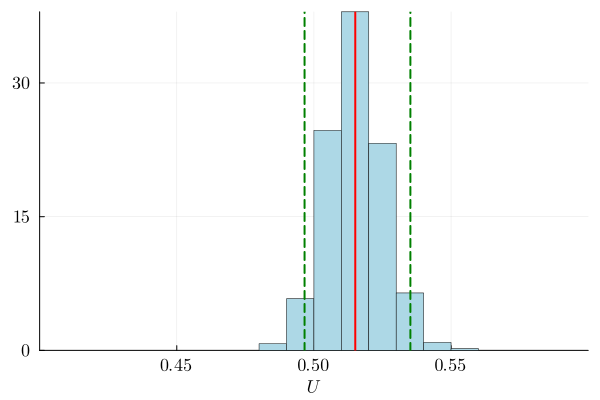

In [58]:
μU = mean(dataU);
ci_low, ci_high = quantile(dataU, [0.025, 0.975])  # 90% CI
b1=histogram(dataU,
    bins = 10,
    normalize = true,
    linewidth = 0.5,
    color = :lightblue,
    xlabel = L"U",
label=false)
b1 = vline!([μU], label = false, color = :red, linewidth = 2)
b1 = vline!([ci_low, ci_high], label = false, color = :green, linestyle = :dash, linewidth = 2)
b1=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
b1=plot!(xlims=(0.40, 0.60))
b1=plot!(xticks=([0.45,0.50,0.55],[L"0.45", L"0.50",L"0.55"]))
b1=plot!(yticks=([0,15,30],[L"0", L"15", L"30"]))
display(b1)

In [69]:
μU

0.5150769857034717

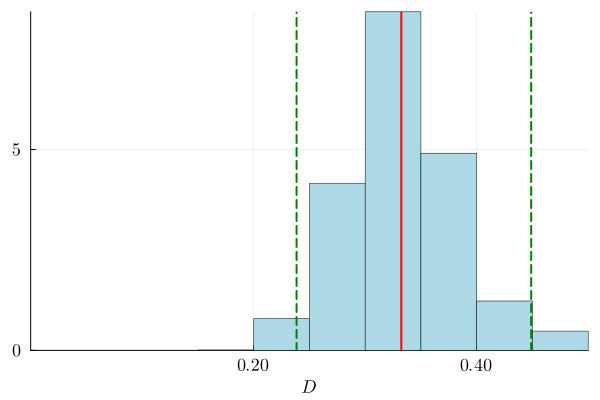

In [59]:
#dataD = samples[3,8000:10000];
μD = mean(dataD);
ci_low, ci_high = quantile(dataD, [0.025, 0.975])  # 90% CI
b2=histogram(dataD,
    bins = 10,
    normalize = true,
    linewidth = 0.5,
    color = :lightblue,
    xlabel = L"D",
label=false)
b2 = vline!([μD], label = false, color = :red, linewidth = 2)
b2 = vline!([ci_low, ci_high], label = false, color = :green, linestyle = :dash, linewidth = 2)
b2=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
b2=plot!(xlims=(0.0,0.50))
b2=plot!(xticks=([0.20,0.40],[L"0.20",L"0.40"]))
b2=plot!(yticks=([0,5],[L"0", L"5"]))
display(b2)

In [70]:
μD

0.3324081748458226

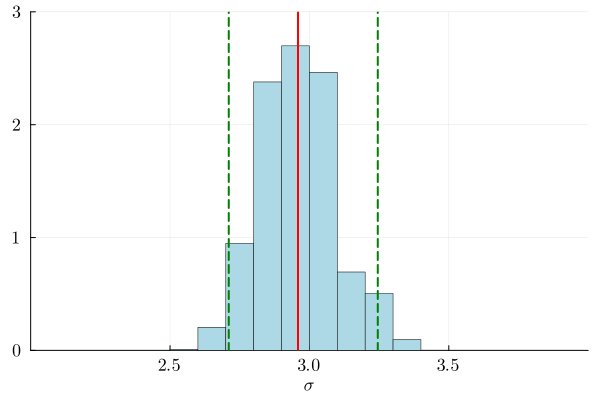

In [60]:
μσ = mean(dataσ);
ci_low, ci_high = quantile(dataσ, [0.025, 0.975])  # 90% CI
b3=histogram(dataσ,
    bins = 10,
    normalize = true,
    linewidth = 0.5,
    color = :lightblue,
    xlabel = L"σ",
label=false)
b3 = vline!([μσ], label = false, color = :red, linewidth = 2)
b3 = vline!([ci_low, ci_high], label = false, color = :green, linestyle = :dash, linewidth = 2)
b3=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
b3=plot!(xlims=(2,4),ylims=(0,3))
b3=plot!(xticks=([2.5,3.0,3.5],[L"2.5", L"3.0",L"3.5"]))
b3=plot!(yticks=([0,1,2,3],[L"0", L"1", L"2",L"3"]))
display(b3)

In [71]:
μσ

2.9590194074029097

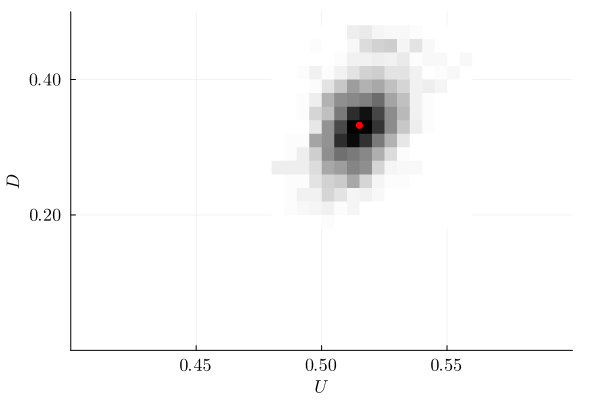

In [61]:
hh = fit(Histogram, (dataU,dataD), nbins=(20,20));
c1 = heatmap(hh.edges[1], hh.edges[2], hh.weights',
             xlabel=L"U", ylabel=L"D",
            colorbar_title="Frequency",colorbar=false,c=reverse(collect(Gray.(LinRange(0, 1, 256)))))
c1=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)

c1 = plot!(ylims=(0.0,0.50))
c1=plot!(yticks=([0.20,0.40],[L"0.20",L"0.40"]))
c1=plot!(xlims=(0.40, 0.60))
c1=plot!(xticks=([0.45,0.50,0.55],[L"0.45", L"0.50",L"0.55"]))
c1=scatter!([μU],[μD],ms=4, msc=:auto, mc=:red,legend=false)

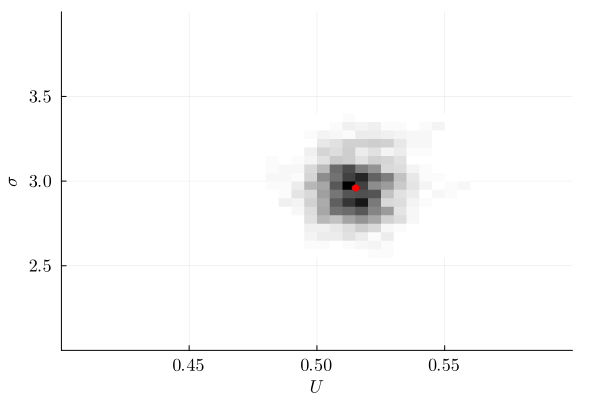

In [62]:
hh = fit(Histogram, (dataU,dataσ), nbins=(20,20));
c2 = heatmap(hh.edges[1], hh.edges[2], hh.weights',
        xlabel=L"U", ylabel=L"σ",
        colorbar_title="Frequency",colorbar=false,c=reverse(collect(Gray.(LinRange(0, 1, 256)))))
c2=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
c2=plot!(ylims=(2,4))
c2=plot!(yticks=([2.5,3.0,3.5],[L"2.5", L"3.0",L"3.5"]))
c2=plot!(xlims=(0.40, 0.60))
c2=plot!(xticks=([0.45,0.50,0.55],[L"0.45", L"0.50",L"0.55"]))
c2=scatter!([μU],[μσ],ms=4,mc=:red,msc=:auto,legend=false)

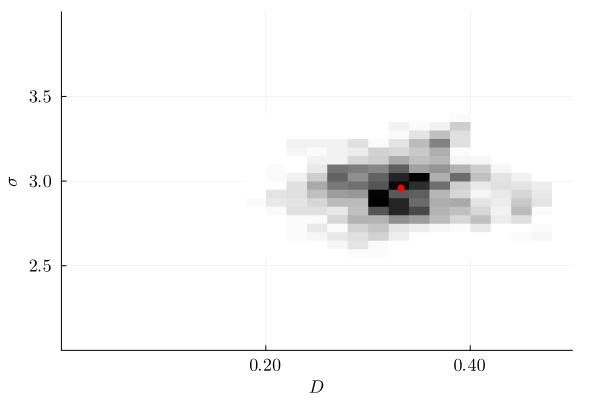

In [63]:
hh = fit(Histogram, (dataD,dataσ), nbins=(20,20));
c3= heatmap(hh.edges[1], hh.edges[2], hh.weights',
        xlabel=L"D", ylabel=L"σ",
        colorbar_title="Frequency",colorbar=false,c=reverse(collect(Gray.(LinRange(0, 1, 256)))))
c3=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
c3=plot!(ylims=(2,4))
c3=plot!(yticks=([2.5,3.0,3.5],[L"2.5", L"3.0",L"3.5"]))
c3=plot!(xlims=(0.0,0.50))
c3=plot!(xticks=([0.20,0.40],[L"0.20",L"0.40"]))
c3=scatter!([μD],[μσ],ms=4,msc=:auto,mc=:red,legend=false)

In [64]:
blank =plot([], xlim=(0, 1), ylim=(0, 1),
     xlabel="", ylabel="", title="",
     xticks=false, yticks=false,
     legend=false, grid=false,
     framestyle=:none);

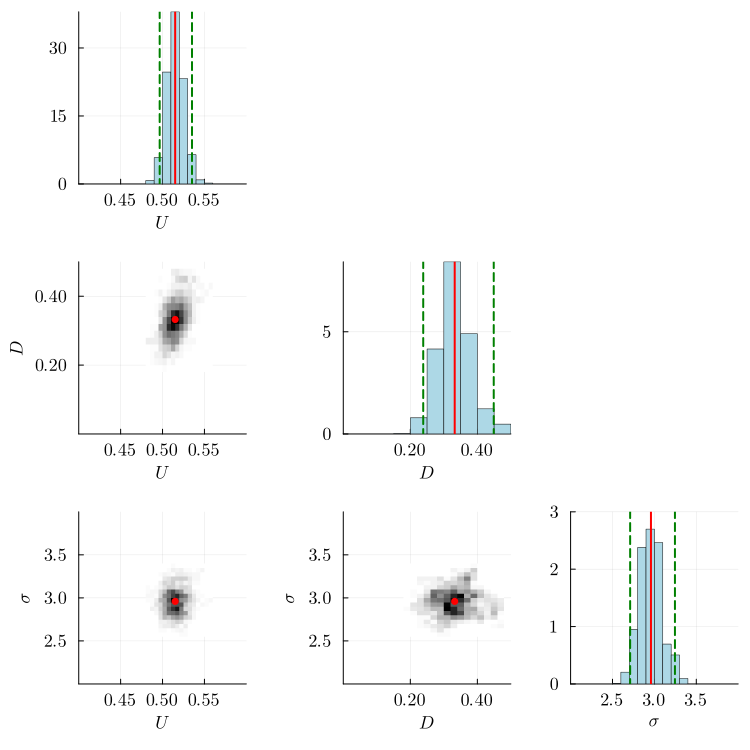

In [68]:
e1=plot(b1,blank,blank,c1,b2,blank,c2,c3,b3,layout=(3,3),size = (750, 750)) #Figure 4
savefig(e1,"MCMC_PlotMatrix.pdf")
display(e1)

In [66]:
e2=plot(a1,a2,a3,layout=(3,1)) #MCMC trace plots Figure 3(a)
#savefig(e2,"MCMC_Trace.pdf")
display(e2)

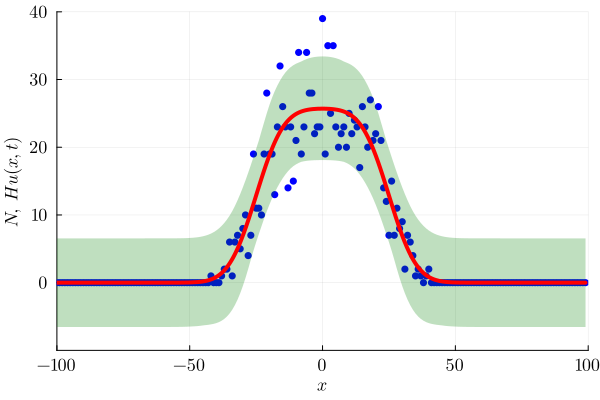

In [67]:
M=1000 #Samples for the prediction intervak
Usampled = zeros(M); Usampled = dataU[1001:end]
Dsampled = zeros(M); Dsampled = dataD[1001:end]
σsampled = zeros(M); σsampled = dataσ[1001:end] #Take last 1000 samples

lower=2*LY*ones(length(xxloc))
upper=zeros(length(xxloc))



for i in 1:M
C(x)=LY*Usampled[i]*(erf((h-x)/sqrt(4*Dsampled[i]*T))+erf((h+x)/sqrt(4*Dsampled[i]*T)))/2; #Evaluate the Hu(x,t) using the surrogate solution

    for j in 1:length(xxloc)
#At each spatial location store the upper/lower values using the 0.95/0.05 quantile of the noise distribution, store the union
        
        if C(xxloc[j])+quantile(Normal(0,σsampled[i]),[0.025,0.975])[1] < lower[j] 
            lower[j] = C(xxloc[j])+quantile(Normal(0,σsampled[i]),[0.025,0.975])[1] 
        end
       
        if C(xxloc[j])+quantile(Normal(0,σsampled[i]),[0.025,0.975])[2] > upper[j] 
            upper[j] = C(xxloc[j])+quantile(Normal(0,σsampled[i]),[0.025,0.975])[2] 
        end
       
    end

end
C(x)=LY*μU*(erf((h-x)/sqrt(4*μD*T))+erf((h+x)/sqrt(4*μD*T)))/2;
r1=scatter(xxloc,data,mc=:blue,label=false,msc=:auto) #Plot the data, MLE solution and prediction interval
r1=plot!(xxloc,lower,lw=0,fillrange=upper,fillalpha=0.25,color=:green,label=false,xlims=(-100,100),ylims=(-10,40))
r1=plot!(C,xxloc[1],xxloc[end],lw=4,label=false,xlabel=L"x",ylabel=L"N, \; H u(x,t)",color=:red)
r1=plot!(xticks = ([-100,-50,0,50,100],  [L"-100", L"-50", L"0", L"50", L"100"]))
r1=plot!(yticks = ([0,10,20,30,40],[L"0", L"10", L"20", L"30", L"40"]))
r1=plot!(xguidefontsize=12, yguidefontsize=12,xtickfontsize=12, ytickfontsize=12)
#savefig(r1,"MCMC_Prediction.pdf")
display(r1) #Figure 3(b)